# NLP Trainer

In [ ]:
!pip install -U spacy[cuda100]

Requirement already up-to-date: spacy[cuda100] in /usr/local/lib/python3.6/dist-packages (2.1.4)
     |████████████████████████████████| 491kB 6.6MB/s 
  Stored in directory: /root/.cache/pip/wheels/eb/ba/a3/9af9f326ed0d75a4540378af64a05a0e42be39d9b8513f3aea
Successfully built thinc-gpu-ops


In [ ]:
!python -m spacy download en_core_web_lg

     |████████████████████████████████| 826.9MB 1.4MB/s 
  Stored in directory: /tmp/pip-ephem-wheel-cache-dff6_0l3/wheels/b4/d7/70/426d313a459f82ed5e06cc36a50e2bb2f0ec5cb31d8e0bdf09
Successfully built en-core-web-lg
✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_lg')


In [ ]:
!spacy link en_core_web_lg en_core_web_lg

✔ Linking successful
/usr/local/lib/python3.6/dist-packages/en_core_web_lg -->
/usr/local/lib/python3.6/dist-packages/spacy/data/en_core_web_lg
You can now load the model via spacy.load('en_core_web_lg')


In [ ]:
!python -m spacy validate

✔ Loaded compatibility table

====================== Installed models (spaCy v2.1.4) ======================
ℹ spaCy installation: /usr/local/lib/python3.6/dist-packages/spacy

TYPE      NAME             MODEL            VERSION                            
package   en-core-web-sm   en_core_web_sm   2.1.0   ✔
link      en               en_core_web_sm   2.1.0   ✔



In [ ]:
# Prepare dummy data

port pandas as pd
df = pd.read_csv('kaggle_train_clean.csv')

import copy

df.dropna(inplace=True)
df.sentences.notna().value_counts()
df['label'] = df['sentiment'].apply(lambda x: {'cats': {'POS': 1, 'NEG': 0}} if x == 1 else {'cats': {'POS': 0, 'NEG': 1}} )
df['input'] = df.apply(lambda x: (x['sentences'], x['label']), axis=1)
df.head()

,sentences,sentiment,id
0,béart berling superb huppert magnificent,1,0
1,coming age story cautionary parable perfectly ...,1,1
2,end movie year old nephew said guess come brok...,1,2
3,can pronounce gyro correctly you appreciate va...,1,3
4,immensely entertaining look unsung heroes 20th...,1,4


In [ ]:
# TRAINER MICROSERVICE #########################################################
import spacy
from spacy.util import minibatch, compounding, decaying
import random
from copy import deepcopy
from pathlib import Path
from collections import defaultdict
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import f1_score, roc_auc_score, cohen_kappa_score, log_loss, accuracy_score
import time

In [ ]:
def nlp_train(data,pipelines,cat_labels,ner_labels,exclusive_label,model,cnn_form,n_iter,ngram_size,batch_size,train_ratio,save_model_dir,meta):

    random.shuffle(data) # assert data == spacy-format train data (!= TRAIN_DATA)

    # Partition off part of the train data for evaluation
    split = int(len(data) * train_ratio)
    train_texts, train_labels = (
        [x[0] for x in data[:split]],
        [x[1] for x in data[:split]],
    )
    dev_texts, dev_labels = [x[0] for x in data[split:]], [x[1] for x in data[split:]]
    train_data = list(zip(train_texts, train_labels))
    if model is None:
        nlp = spacy.blank("en")
    else:
        nlp = model

    if "ner" in pipelines:
        if "ner" not in nlp.pipe_names:
            ner = nlp.create_pipe("ner")
            nlp.add_pipe(ner, last=True)
        else:
            ner = nlp.get_pipe("ner")

        for label in ner_labels:
            ner.add_label(label)

    if "textcat" in pipelines:
        # add the text classifier to the pipeline if it doesn't exist
        # nlp.create_pipe works for built-ins that are registered with spaCy
        if "textcat" not in nlp.pipe_names:
            textcat = nlp.create_pipe(
                "textcat",
                config={
                    "exclusive_classes": exclusive_label,
                    "architecture": cnn_form,
                    "ngram_size": ngram_size,
                },
            )
            nlp.add_pipe(textcat, last=True)
        # otherwise, get it, so we can add labels to it
        else:
            textcat = nlp.get_pipe("textcat")
            
        # add label to text classifier
        for label in cat_labels:
            textcat.add_label(label)


    # dictionary storing evaluations (OUTPUT DATAFRAME)
#     eval_info = defaultdict(list)
    

    # get names of other pipes to disable them during training
    other_pipes = [pipe for pipe in nlp.pipe_names if pipe not in pipelines]

    with nlp.disable_pipes(*other_pipes):
        
        optimizer = nlp.begin_training()
        if "ner" in pipelines:
            optimizer = nlp.resume_training()

        print("Begin training the model...")

        batch_sizes = compounding(4.0, batch_size, 1.001)
        dropouts = decaying(0.6, 0.4, 1e-4)
        
        count_epoch = 0
        for i in range(n_iter):
            start_time = time.time()
            
            count_epoch += 1
            print(f"=== Running epoch: {count_epoch} of {n_iter} ===")
            losses = {}

            random.shuffle(train_data)
            batches = minibatch(train_data, size=batch_sizes)
            for batch in batches:
                texts, annotations = zip(*batch)
                nlp.update(
                    texts,
                    annotations,
                    sgd=optimizer,
                    drop=next(dropouts),
                    losses=losses,
                )
                
            # Toggle in-epoch scores
                
#             with textcat.model.use_params(optimizer.averages):
#                 if "textcat" in pipelines:
#                     eval_info["dev_loss_textcat"].append(losses["textcat"])
#                 if "ner" in pipelines:
#                     eval_info["dev_loss_ner"].append(losses["ner"])

#                 train_scores = textcat.predict(list(nlp.tokenizer.pipe(train_texts)))
#                 train_pred = [1 if i[0] > 0.5 else 0 for i in train_scores[0]]
#                 train_true = [
#                     1 if x["cats"][cat_labels[0]] == True else 0 for x in train_labels
#                 ]
#                 eval_info["train_cohen"].append(
#                     cohen_kappa_score(train_true, train_pred)
#                 )
#                 eval_info["train_fscore"].append(f1_score(train_true, train_pred))
#                 eval_info["train_roc_auc"].append(roc_auc_score(train_true, train_pred))
#                 eval_info["train_logloss"].append(log_loss(train_true, train_pred))

#                 dev_scores = textcat.predict(list(nlp.tokenizer.pipe(dev_texts)))
#                 dev_pred = [1 if i[0] > 0.5 else 0 for i in dev_scores[0]]
#                 dev_true = [
#                     1 if x["cats"][cat_labels[0]] == True else 0 for x in dev_labels
#                 ]
#                 eval_info["dev_cohen"].append(cohen_kappa_score(dev_true, dev_pred))
#                 eval_info["dev_fscore"].append(f1_score(dev_true, dev_pred))
#                 eval_info["dev_roc_auc"].append(roc_auc_score(dev_true, dev_pred))
#                 eval_info["dev_logloss"].append(log_loss(dev_true, dev_pred))

            print(f"Time elasped ===> {time.time() - start_time}")
            print(f"Loss ==> \t{losses['textcat']}")

    # Storing Accuracy for Plotting
    global accuracy_dict
    accuracy_dict['num_trained'].append(sum([accuracy_dict['num_trained'][-1], len(train_texts)]))
    test_pred = nlp.get_pipe("textcat").predict(nlp.tokenizer.pipe(dev_texts))
    test_pred = test_pred[0]
    test_pred = list(map(lambda x: 0 if x[1] > 0.5 else 1, test_pred))
    dev_true = [1 if x["cats"][cat_labels[0]] == True else 0 for x in dev_labels]
    accuracy_dict['accuracy'].append(accuracy_score(dev_true, test_pred))

    # save model to disk
    save_model_dir = Path(save_model_dir)
    if not save_model_dir.exists():
        save_model_dir.mkdir()
    with nlp.use_params(optimizer.averages):
        for key, value in meta.items():
            nlp.meta[key] = value
        nlp.to_disk(save_model_dir) # app_files/projects/<project:token>/models/<save_model_dir>
    print("Saved model to", save_model_dir)
    
    
#     return eval_info


In [ ]:
spacy.prefer_gpu()

True

In [ ]:
# INIT 

CATS = ["POS", "NEG"] 
NERS = ["FRUIT", "ANIMAL"]  # no new NER tags
MODEL = spacy.load("en_core_web_lg") 
LANGUAGE = "en" 
PIPELINE = ["textcat", "ner"] 
CNN_FORM = "simple_cnn"  

# Training HYPERPARAMS

N_ITER = 20
NGRAM_SIZE = 1 
BATCH_SIZE = 18.0  
TRAIN_RATIO = 0.8 
SAVE_MODEL_DIR = "./RA_model_test" 


META = {
    "author": "RA tester",
    "description": "IMDB Review sentiment classification on 500 entries, based on English multi-task CNN trained on OntoNotes with GloVe vectors",
    "email": "",
    "url": "",
    "lang": "en",
    "license": "MIT",
    "name": "imdb_sentiment",
    "version": "0.0.1",
}


In [ ]:
# random sample 200 from data

import random
df_shuffle = df.sample(frac=1)
# df_200 = df.sample(frac=0.025)
# df_200.shape

In [ ]:
# construct accuracy dict

accuracy_dict = {'num_trained': [0], 'accuracy': [0.0]}
accuracy_dict

{'accuracy': [0.0], 'num_trained': [0]}

In [ ]:
df_list = [df_shuffle[round(x):round(x)+500] for x in range(0, df_shuffle.shape[0], 500)]

In [ ]:
# testing loop train and accuracy dict

for df_i in df_list:

    eval_info = nlp_train( 
        data = copy.copy(df_i['input'].values),
        pipelines=PIPELINE, 
        cat_labels=CATS, 
        ner_labels=NERS, 
        exclusive_label=True, 
        model=MODEL, 
        cnn_form=CNN_FORM, 
        n_iter=N_ITER, 
        ngram_size=NGRAM_SIZE, 
        batch_size=BATCH_SIZE, 
        train_ratio=TRAIN_RATIO, 
        save_model_dir=SAVE_MODEL_DIR, 
        meta=META)

Begin training the model...
=== Running epoch: 1 of 20 ===
Time elasped ===> 11.058228015899658
Loss ==> 	3.7314686607569456
=== Running epoch: 2 of 20 ===
Time elasped ===> 10.341388702392578
Loss ==> 	2.9793990212492645
=== Running epoch: 3 of 20 ===
Time elasped ===> 8.932857751846313
Loss ==> 	1.9033579579554498
=== Running epoch: 4 of 20 ===
Time elasped ===> 8.466221570968628
Loss ==> 	1.1808131728321314
=== Running epoch: 5 of 20 ===
Time elasped ===> 7.794079065322876
Loss ==> 	0.7431356079177931
=== Running epoch: 6 of 20 ===
Time elasped ===> 7.176217794418335
Loss ==> 	0.4625625777589448
=== Running epoch: 7 of 20 ===
Time elasped ===> 7.117434740066528
Loss ==> 	0.3469610980296771
=== Running epoch: 8 of 20 ===
Time elasped ===> 6.438668489456177
Loss ==> 	0.1465142100223602
=== Running epoch: 9 of 20 ===
Time elasped ===> 6.384673833847046
Loss ==> 	0.0872178926454108
=== Running epoch: 10 of 20 ===
Time elasped ===> 5.798567771911621
Loss ==> 	0.05692677352547015
=== Runn

In [ ]:
pd.DataFrame(accuracy_dict)

,num_trained,accuracy
0,0,0.000000
1,170,0.558140
2,340,0.651163
3,510,0.488372


In [ ]:
import pickle
with open('accu.pkl', 'wb') as file:
    pickle.dump(accuracy_dict, file)

# Plotter

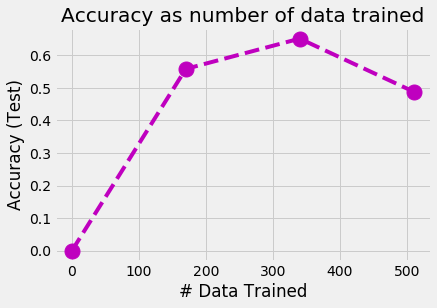

In [ ]:
import pickle
import matplotlib.pyplot as plt 

with open('accu.pkl', 'rb') as file:
    accu = pickle.load(file)

with plt.style.context('fivethirtyeight'):
#     with plt.rc_context({'figure.figsize': (50, 30)}):
        plt.plot(accu['num_trained'], accu['accuracy'], 'mo--', markersize=15)
        plt.title('Accuracy as number of data trained')
        plt.xlabel('# Data Trained')
        plt.ylabel('Accuracy (Test)')

# Keras RNN

In [ ]:
df_single.head(2)

,lowest_newprice,lowest_usedprice,total_new,total_used,sales_rank,sentiment,star,newprice_ternary_1D,newprice_ternary_3D,newprice_ternary_7D,newprice_ternary_1D_ew,newprice_ternary_3D_ew,newprice_ternary_7D_ew,newprice_1D,newprice_3D,newprice_7D,newprice_1D_ew,newprice_3D_ew,newprice_7D_ew,usedprice_ternary_1D,usedprice_ternary_3D,usedprice_ternary_7D,usedprice_ternary_1D_ew,usedprice_ternary_3D_ew,usedprice_ternary_7D_ew,usedprice_1D,usedprice_3D,usedprice_7D,usedprice_1D_ew,usedprice_3D_ew,usedprice_7D_ew,newstock_ternary_1D,newstock_ternary_3D,newstock_ternary_7D,newstock_ternary_1D_ew,newstock_ternary_3D_ew,newstock_ternary_7D_ew,newstock_1D,newstock_3D,newstock_7D,newstock_1D_ew,newstock_3D_ew,newstock_7D_ew,usedstock_ternary_1D,usedstock_ternary_3D,usedstock_ternary_7D,usedstock_ternary_1D_ew,usedstock_ternary_3D_ew,usedstock_ternary_7D_ew,usedstock_1D,usedstock_3D,usedstock_7D,usedstock_1D_ew,usedstock_3D_ew,usedstock_7D_ew
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-02-08,34.95,29.00,87.0,29.0,126.0,0.124752,4.006684,up,up,down,up,up,down,2.04,1.00,-0.47,1.165714,1.564343,-0.357773,up,down,down,up,down,down,0.99,-4.01,-4.01,0.565714,-2.362743,-4.243057,none,down,up,none,down,down,0.0,-6.0,2.0,0.000000,-3.565714,-0.301416,down,down,up,down,down,up,-7.0,-2.0,2.0,-4.000000,-4.091429,0.067079
2015-02-09,36.99,29.99,87.0,22.0,125.0,0.123548,4.004942,up,down,down,up,up,down,0.80,-1.04,-7.00,0.724015,0.213646,-2.767447,down,down,down,down,down,down,-5.00,-7.30,-5.00,-1.978687,-4.222308,-4.745777,down,down,up,down,down,up,-5.0,-4.0,3.0,-2.162162,-3.708067,0.590940,none,up,up,down,up,up,0.0,9.0,9.0,-1.297297,1.905250,4.589538


In [ ]:
import pickle

with open('panel_200.pkl', 'rb') as file:
    panel_200 = pickle.load(file)
panel_200.head()

df_single = panel_200.query('id == 1').droplevel(0, axis=0).copy()
df_single.head()


,lowest_newprice,lowest_usedprice,total_new,total_used,sales_rank,sentiment,star,newprice_ternary_1D,newprice_ternary_3D,newprice_ternary_7D,newprice_ternary_1D_ew,newprice_ternary_3D_ew,newprice_ternary_7D_ew,newprice_1D,newprice_3D,newprice_7D,newprice_1D_ew,newprice_3D_ew,newprice_7D_ew,usedprice_ternary_1D,usedprice_ternary_3D,usedprice_ternary_7D,usedprice_ternary_1D_ew,usedprice_ternary_3D_ew,usedprice_ternary_7D_ew,usedprice_1D,usedprice_3D,usedprice_7D,usedprice_1D_ew,usedprice_3D_ew,usedprice_7D_ew,newstock_ternary_1D,newstock_ternary_3D,newstock_ternary_7D,newstock_ternary_1D_ew,newstock_ternary_3D_ew,newstock_ternary_7D_ew,newstock_1D,newstock_3D,newstock_7D,newstock_1D_ew,newstock_3D_ew,newstock_7D_ew,usedstock_ternary_1D,usedstock_ternary_3D,usedstock_ternary_7D,usedstock_ternary_1D_ew,usedstock_ternary_3D_ew,usedstock_ternary_7D_ew,usedstock_1D,usedstock_3D,usedstock_7D,usedstock_1D_ew,usedstock_3D_ew,usedstock_7D_ew
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-02-08,34.95,29.00,87.0,29.0,126.0,0.124752,4.006684,up,up,down,up,up,down,2.04,1.00,-0.47,1.165714,1.564343,-0.357773,up,down,down,up,down,down,0.99,-4.01,-4.01,0.565714,-2.362743,-4.243057,none,down,up,none,down,down,0.0,-6.0,2.0,0.000000,-3.565714,-0.301416,down,down,up,down,down,up,-7.0,-2.0,2.0,-4.000000,-4.091429,0.067079
2015-02-09,36.99,29.99,87.0,22.0,125.0,0.123548,4.004942,up,down,down,up,up,down,0.80,-1.04,-7.00,0.724015,0.213646,-2.767447,down,down,down,down,down,down,-5.00,-7.30,-5.00,-1.978687,-4.222308,-4.745777,down,down,up,down,down,up,-5.0,-4.0,3.0,-2.162162,-3.708067,0.590940,none,up,up,down,up,up,0.0,9.0,9.0,-1.297297,1.905250,4.589538
2015-02-10,37.79,24.99,82.0,22.0,125.0,0.120787,4.007193,down,down,down,down,down,down,-1.84,-3.81,-7.80,-0.325387,-1.224877,-4.381129,none,down,none,down,down,down,0.00,-2.30,0.00,-0.949770,-3.050597,-2.722037,down,up,up,down,down,up,-1.0,4.0,11.0,-1.403552,-0.722305,4.186062,up,up,up,up,up,up,5.0,6.0,16.0,1.205869,3.535492,8.114922
2015-02-11,35.95,24.99,81.0,27.0,133.0,0.121742,4.020433,none,down,down,down,down,down,0.00,-3.73,-5.96,-0.184983,-1.878945,-4.700107,down,none,none,down,down,down,-2.30,0.00,0.00,-1.293851,-1.969967,-1.739636,up,up,up,down,up,up,2.0,9.0,12.0,-0.142352,2.378985,6.627474,up,up,up,up,up,up,4.0,4.0,15.0,1.996678,3.414948,9.566902
2015-02-12,35.95,22.69,83.0,31.0,122.0,0.122911,4.023474,down,down,down,down,down,down,-1.97,-1.47,-5.96,-0.714507,-1.737133,-4.986102,none,up,down,down,down,down,0.00,2.30,-0.69,-0.806976,-0.586463,-1.193888,up,up,up,up,up,up,3.0,6.0,12.0,0.823600,3.406651,8.044772,down,none,up,up,up,up,-3.0,0.0,18.0,0.332945,2.161830,11.320139


In [ ]:


newprice_train = df_single.iloc[:round(0.8*df_single.shape[0]), 0].values
newprice_test = df_single.iloc[round(0.8*df_single.shape[0]):, 0].values

oldprice_train = df_single.iloc[:round(0.8*df_single.shape[0]), 1].values
oldprice_test = df_single.iloc[round(0.8*df_single.shape[0]):, 1].values

newstock_train = df_single.iloc[:round(0.8*df_single.shape[0]), 2].values
newstock_test = df_single.iloc[round(0.8*df_single.shape[0]):, 2].values

oldstock_train = df_single.iloc[:round(0.8*df_single.shape[0]), 3].values
oldstock_test = df_single.iloc[round(0.8*df_single.shape[0]):, 3].values

rank_train = df_single.iloc[:round(0.8*df_single.shape[0]), 4].values
rank_test = df_single.iloc[round(0.8*df_single.shape[0]):, 4].values

sentiment_train = df_single.iloc[:round(0.8*df_single.shape[0]), 5].values
sentiment_test = df_single.iloc[round(0.8*df_single.shape[0]):, 5].values

star_train = df_single.iloc[:round(0.8*df_single.shape[0]), 6].values
star_test = df_single.iloc[round(0.8*df_single.shape[0]):, 6].values

In [ ]:
newprice_1D_ternary_train = df_single.iloc[:round(0.8*df_single.shape[0]), 7].values
newprice_1D_ternary_test = df_single.iloc[round(0.8*df_single.shape[0]):, 7].values
newprice_1D_ternary_test = newprice_1D_ternary_test.reshape((newprice_1D_ternary_test.shape[0], 1))
newprice_1D_ternary_train = newprice_1D_ternary_train.reshape((newprice_1D_ternary_train.shape[0], 1))

In [ ]:
newprice_train = newprice_train.reshape((newprice_train.shape[0], 1))
oldprice_train = oldprice_train.reshape((oldprice_train.shape[0], 1))
newstock_train = newstock_train.reshape((newstock_train.shape[0], 1))
oldstock_train = oldstock_train.reshape((oldstock_train.shape[0], 1))


newprice_test = newprice_test.reshape((newprice_test.shape[0], 1))
oldprice_test = oldprice_test.reshape((oldprice_test.shape[0], 1))
newstock_test = newstock_test.reshape((newstock_test.shape[0], 1))
oldstock_test = oldstock_test.reshape((oldstock_test.shape[0], 1))


rank_train = rank_train.reshape((rank_train.shape[0], 1))
sentiment_train = sentiment_train.reshape((sentiment_train.shape[0], 1))
star_train = star_train.reshape((star_train.shape[0], 1))

rank_test = rank_test.reshape((rank_test.shape[0], 1))
sentiment_test = sentiment_test.reshape((sentiment_test.shape[0], 1))
star_test = star_test.reshape((star_test.shape[0], 1))


In [ ]:
dataset_test = hstack((oldstock_test, 
                       newstock_test, 
                       oldprice_test,
                       rank_test,
                       sentiment_test,
                       star_test,
#                        newprice_test
                       newprice_1D_ternary_test,
                      ))
dataset_train = hstack((oldstock_train, 
                        newstock_train, 
                        oldprice_train, 
                        rank_train,
                        sentiment_train,
                        star_train,
#                         newprice_train
                        newprice_1D_ternary_train,
                       ))

In [ ]:
import pprint
pprint.pprint(df_single.columns.values.tolist())

['lowest_newprice',
 'lowest_usedprice',
 'total_new',
 'total_used',
 'sales_rank',
 'sentiment',
 'star',
 'newprice_ternary_1D',
 'newprice_ternary_3D',
 'newprice_ternary_7D',
 'newprice_ternary_1D_ew',
 'newprice_ternary_3D_ew',
 'newprice_ternary_7D_ew',
 'newprice_1D',
 'newprice_3D',
 'newprice_7D',
 'newprice_1D_ew',
 'newprice_3D_ew',
 'newprice_7D_ew',
 'usedprice_ternary_1D',
 'usedprice_ternary_3D',
 'usedprice_ternary_7D',
 'usedprice_ternary_1D_ew',
 'usedprice_ternary_3D_ew',
 'usedprice_ternary_7D_ew',
 'usedprice_1D',
 'usedprice_3D',
 'usedprice_7D',
 'usedprice_1D_ew',
 'usedprice_3D_ew',
 'usedprice_7D_ew',
 'newstock_ternary_1D',
 'newstock_ternary_3D',
 'newstock_ternary_7D',
 'newstock_ternary_1D_ew',
 'newstock_ternary_3D_ew',
 'newstock_ternary_7D_ew',
 'newstock_1D',
 'newstock_3D',
 'newstock_7D',
 'newstock_1D_ew',
 'newstock_3D_ew',
 'newstock_7D_ew',
 'usedstock_ternary_1D',
 'usedstock_ternary_3D',
 'usedstock_ternary_7D',
 'usedstock_ternary_1D_ew',
 'u

In [ ]:
# univariate lstm example
from numpy import array
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense

# split a univariate sequence into samples
def split_sequence(sequence, n_steps):
	X, y = list(), list()
	for i in range(len(sequence)):
		# find the end of this pattern
		end_ix = i + n_steps
		# check if we are beyond the sequence
		if end_ix > len(sequence)-1:
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)

# define input sequence
raw_seq = [10, 20, 30, 40, 50, 60, 70, 80, 90]
# choose a number of time steps
n_steps = 3
# split into samples
X, y = split_sequence(raw_seq, n_steps)


Using TensorFlow backend.


In [ ]:
# reshape from [samples, timesteps] into [samples, timesteps, features]
n_features = 1 # Univariate TS
X = X.reshape((X.shape[0], X.shape[1], n_features))
# define model
model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(n_steps, n_features))) # Single Layer
model.add(Dense(1)) # Prediction Layer
model.compile(optimizer='adam', loss='mse')
# fit model
model.fit(X, y, epochs=200, verbose=0)
# demonstrate prediction
x_input = array([70, 80, 90])
x_input = x_input.reshape((1, n_steps, n_features))
yhat = model.predict(x_input, verbose=0)
print(yhat)

In [ ]:
import matplotlib as mpl
from matplotlib import pylab as plt
import matplotlib.dates as mdates
import seaborn as sns
from keras.layers import Bidirectional
import collections
from keras.layers import Flatten
from keras.layers import Dropout
from keras.layers import TimeDistributed
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
from keras.layers import ConvLSTM2D
import pickle

from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense

import pandas as pd
import numpy as np

from sklearn.metrics import explained_variance_score, mean_absolute_error, mean_squared_error
from collections import defaultdict

sns.set_context("notebook", font_scale=1.0)
sns.set_style("whitegrid")
%config InlineBackend.figure_format = 'retina'

Using TensorFlow backend.


In [ ]:
def lstm_vanilla(entity, y_name, n_steps, n_features, n_epochs):

    df_single = panel_200.query(f"id == {entity}").droplevel(0, axis=0).copy()
    
#     X_train = df_single.iloc[:round(0.8*df_single.shape[0]), 0].values
#     X_test = df_single.iloc[round(0.8*df_single.shape[0]):, 0].values
    
    target_train = df_single.iloc[: round(0.8 * df_single.shape[0]),
                                 df_single.columns.get_loc(y_name)]
    target_test = df_single.iloc[round(0.8 * df_single.shape[0]) :, 
                                df_single.columns.get_loc(y_name)]
    
    # split a univariate sequence into samples
    def split_sequence(sequence, n_steps):
        X, y = list(), list()
        for i in range(len(sequence)):
            # find the end of this pattern
            end_ix = i + n_steps
            # check if we are beyond the sequence
            if end_ix > len(sequence)-1:
                break
            # gather input and output parts of the pattern
            seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
            X.append(seq_x)
            y.append(seq_y)
        return array(X), array(y)

    X, y = split_sequence(target_train, n_steps)
    X = X.reshape((X.shape[0], X.shape[1], n_features))

    model = Sequential()
    
    model.add(Bidirectional(LSTM(50, activation='relu', return_sequences=True),
                            input_shape=(n_steps, n_features)))
    model.add(Dropout(0.3))
#     model.add(Bidirectional(LSTM(200, activation='relu', return_sequences=True)))
#     model.add(Dropout(0.3))
#     model.add(Bidirectional(LSTM(100, activation='relu', return_sequences=True)))
#     model.add(Dropout(0.3))
    model.add(Bidirectional(LSTM(50, activation='relu')))
    model.add(Dropout(0.3))
    model.add(Dense(1))
    
    model.compile(optimizer='adam', loss='mse')
    print("Training", '.'*10, '\n')
    model.fit(X, y, epochs=n_epochs, verbose=0)
    
    X_test, y_test = split_sequence(np.concatenate((target_train[-n_steps:], target_test), axis=0), n_steps)
    X_test = X_test.reshape((X_test.shape[0], n_steps, n_features))
    print("Predicting", '.'*10, '\n')
    y_pred = model.predict(X_test, verbose=0)
    
    
    metric_dict = defaultdict(list)
    
    metric_dict["EXP_VAR"] = explained_variance_score(
        y_test, y_pred
    )
    metric_dict["MAE"] = mean_absolute_error(y_test, y_pred)
    metric_dict["MSE"] = mean_squared_error(y_test, y_pred)

    metric_df = pd.DataFrame(metric_dict, index=[y_name])


    def lstm_plot(y_test, y_pred):
        colors = sns.color_palette()
        c1, c2 = colors[0], colors[1]
        fig = plt.figure(figsize=(12, 6))
        ax = fig.add_subplot(1, 1, 1)
        ax.plot(y_test, lw=2, color=c1, label="ground truth")
        ax.plot(y_pred, lw=2, ls="--", color=c2, label="forecast")
        # ax.axvline(time_index[-num_forecast_steps], linestyle="--")
        ax.legend(loc="upper left")
        ax.set_ylabel("Y value")
        ax.set_xlabel("Time")
        fig

    lstm_plot(y_test, y_pred)
    
    return metric_df

Training .......... 

Predicting .......... 



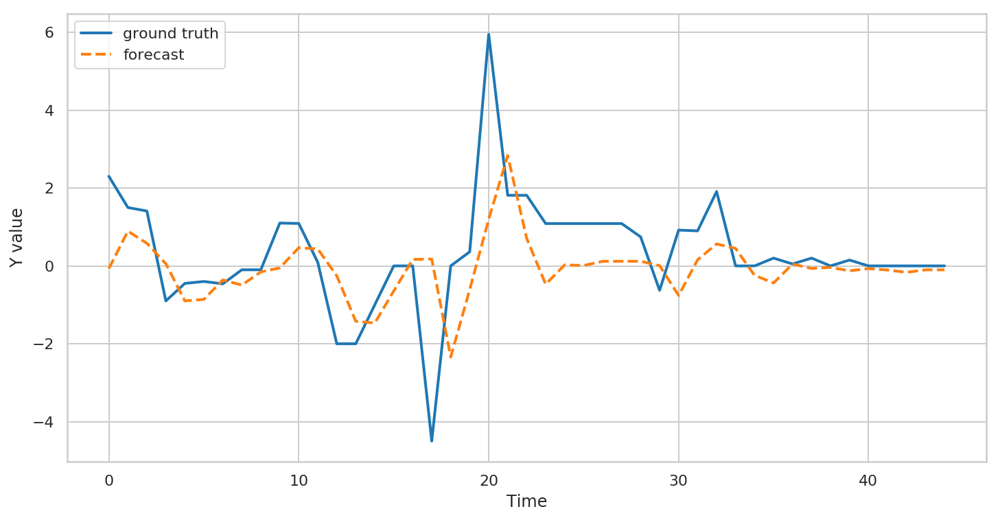

In [ ]:
tmp_metric = lstm_vanilla(1, 'newprice_3D', n_steps=3, n_features=1, n_epochs=50)

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


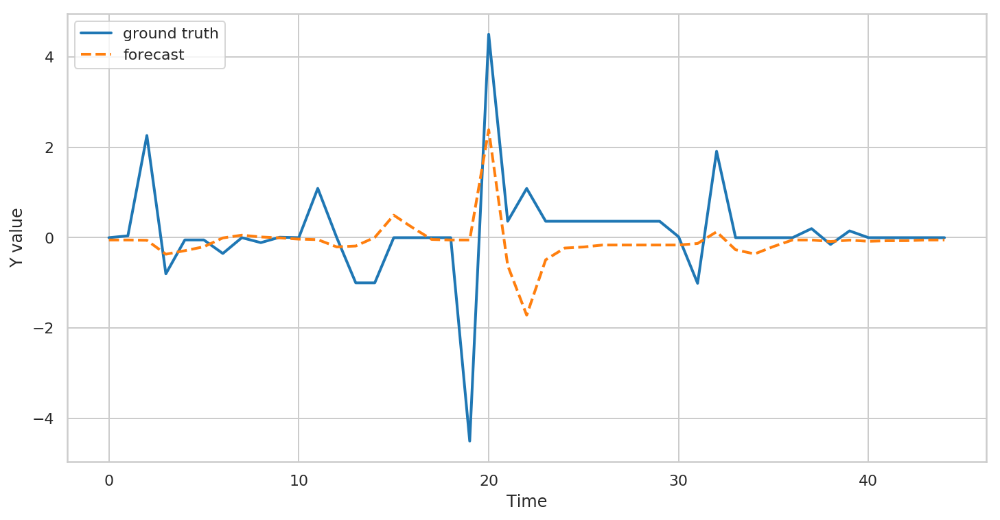

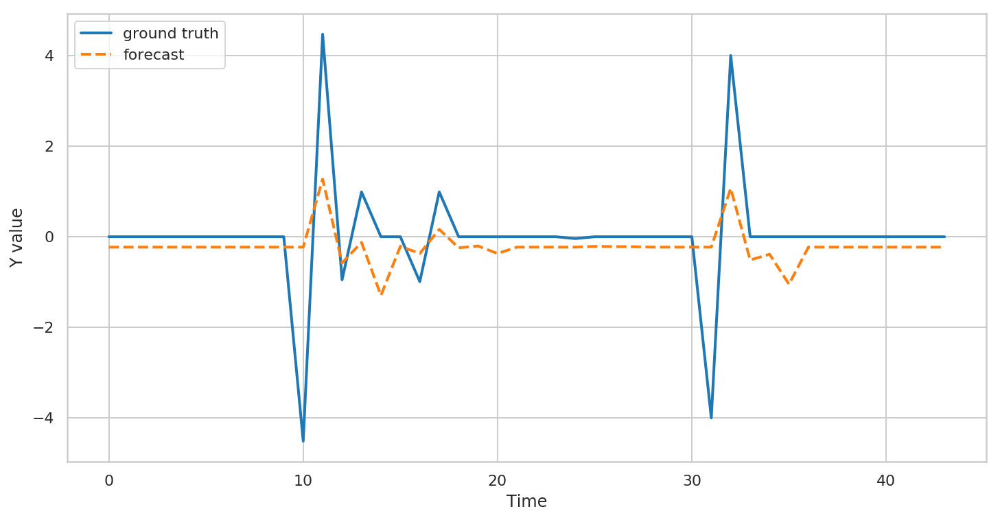

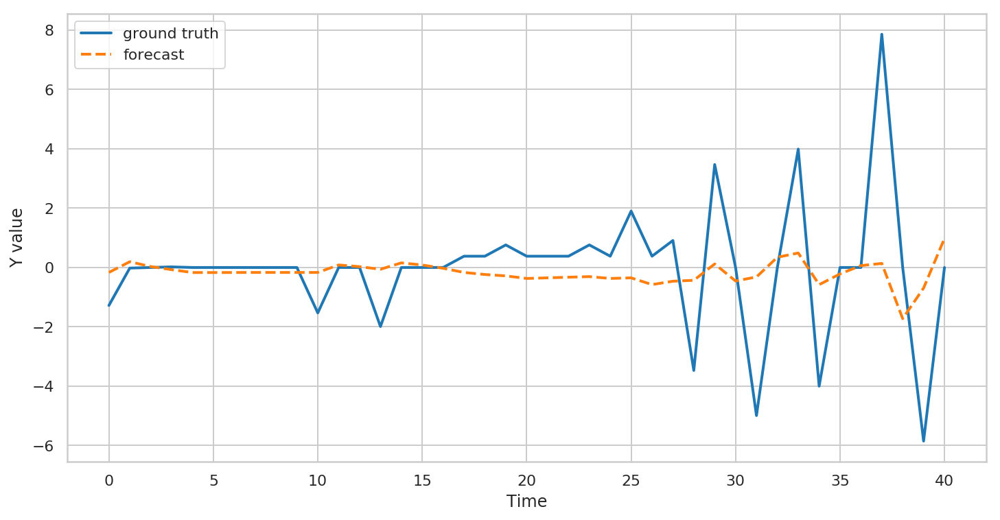

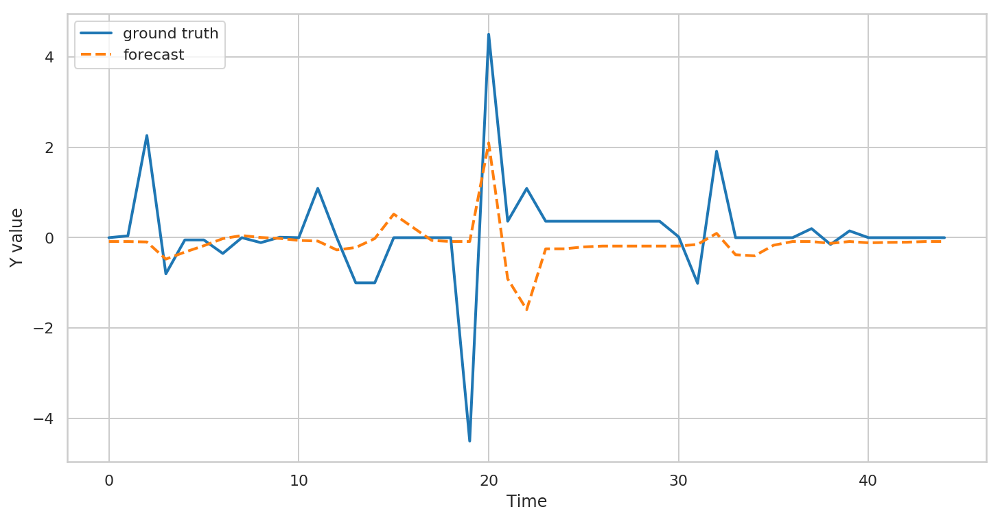

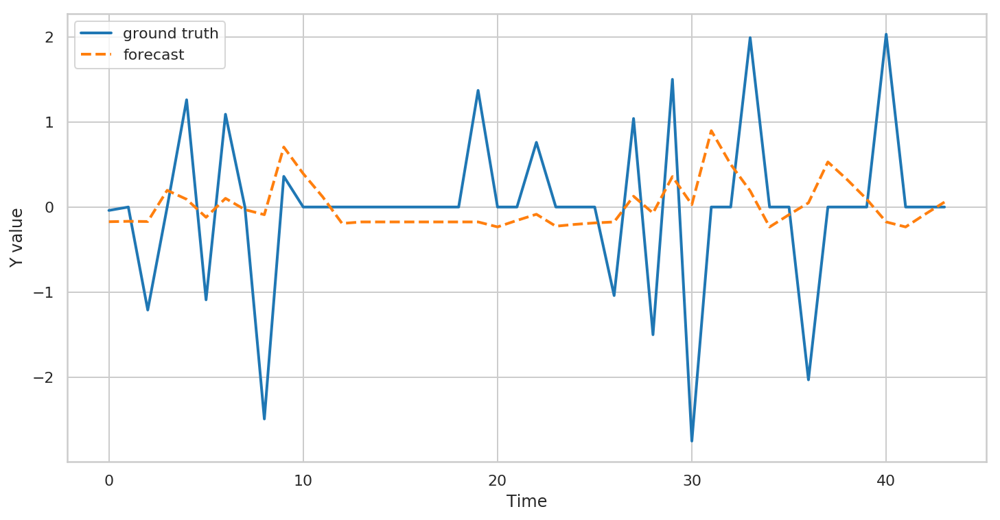

...

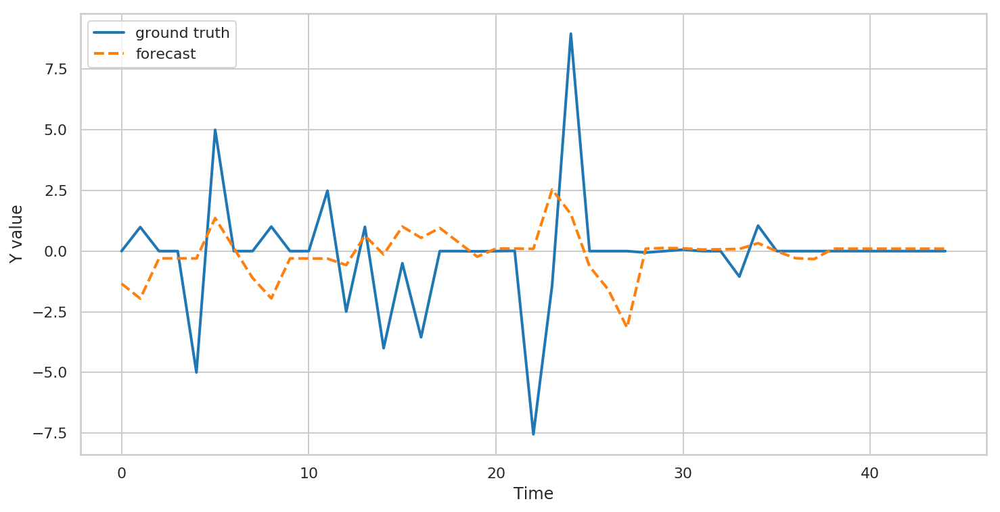

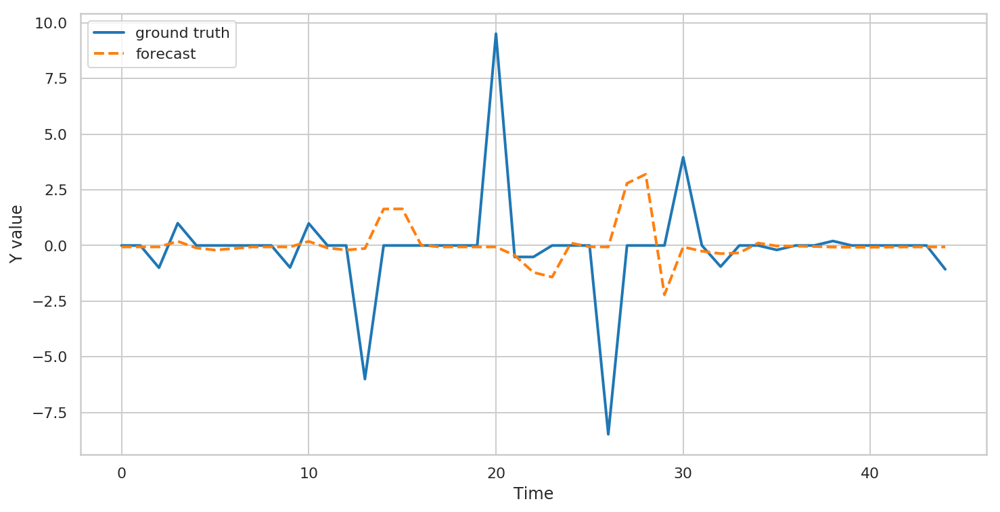

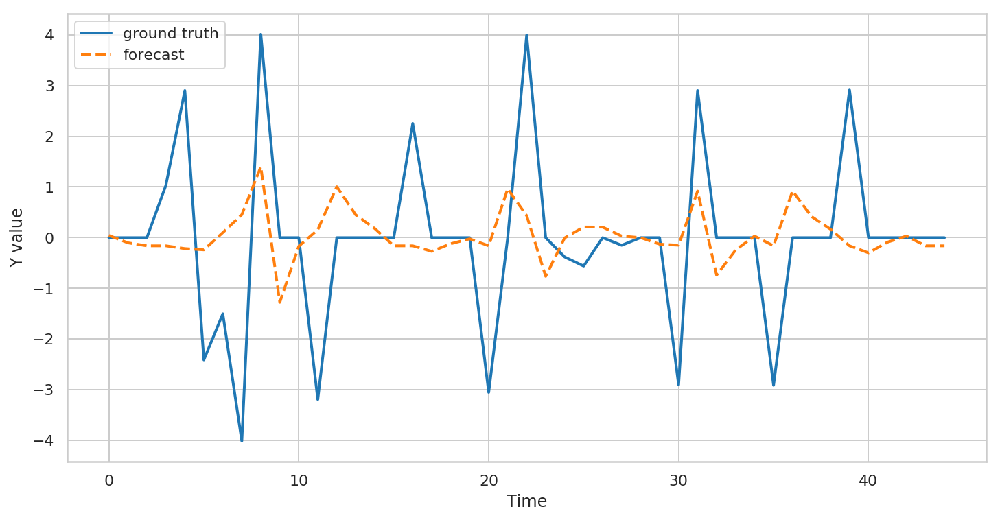

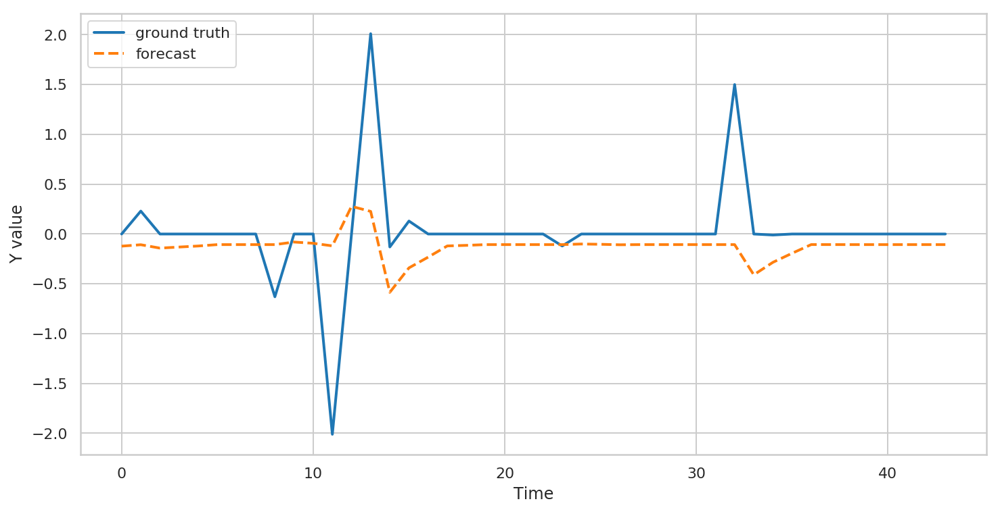

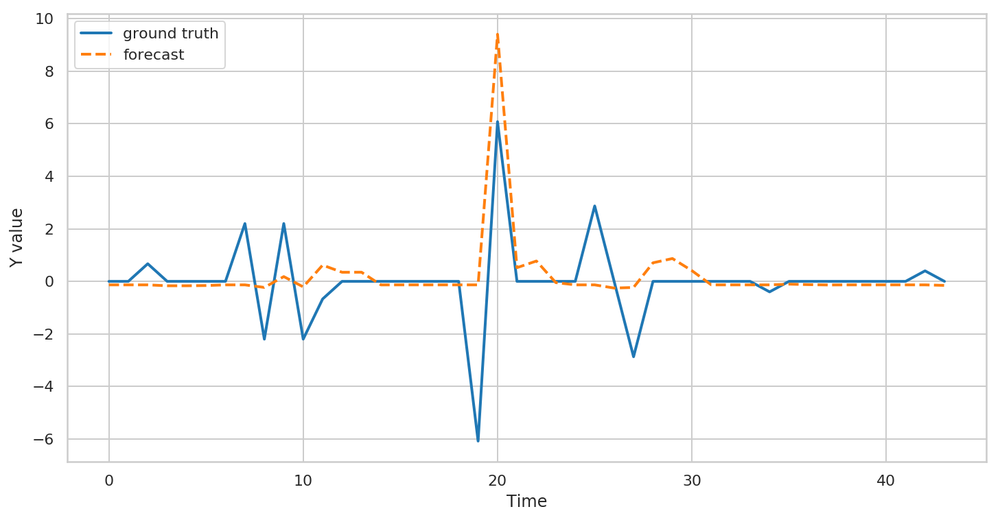

In [ ]:
metricDF_newprice_1D_lstm = [lstm_vanilla(i, "newprice_1D", 3, 1, 50) for i in panel_200.index.get_level_values('id').unique().values]
with open('metric_newprice_1D_lstm.pkl', 'wb') as file:
    pickle.dump(pd.concat(metricDF_newprice_1D_lstm), file)

In [ ]:
from google.colab import drive

drive.mount('/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /gdrive


W0724 13:26:00.670232 140298645534592 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0724 13:26:00.725020 140298645534592 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0724 13:26:00.731777 140298645534592 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0724 13:26:01.131082 140298645534592 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:133: The name tf.placeholder_with_default is deprecated. Please use tf.compat.v1.placeholder_with_default instead.

W0724 13:26:01.139610 

Training .......... 



W0724 13:26:02.113970 140298645534592 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/math_grad.py:1250: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
W0724 13:26:04.188648 140298645534592 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:986: The name tf.assign_add is deprecated. Please use tf.compat.v1.assign_add instead.



Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


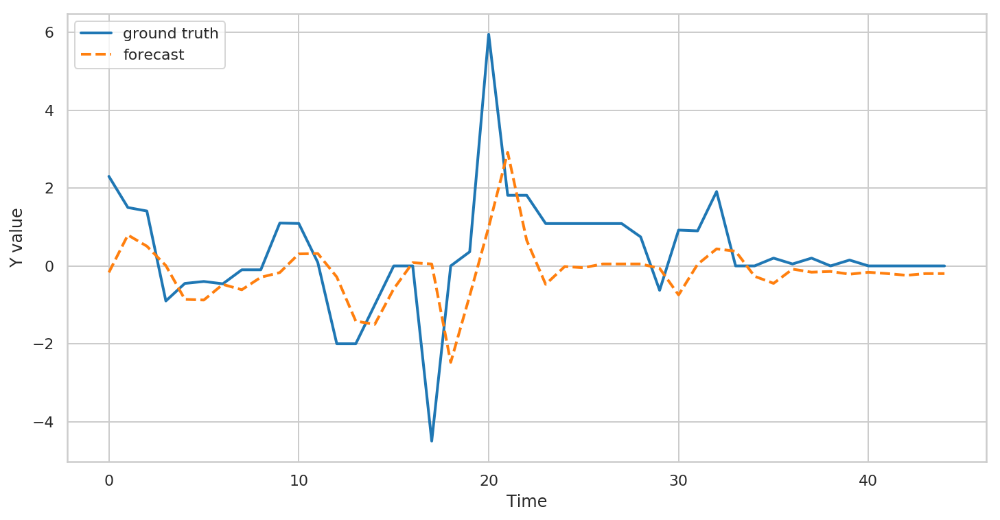

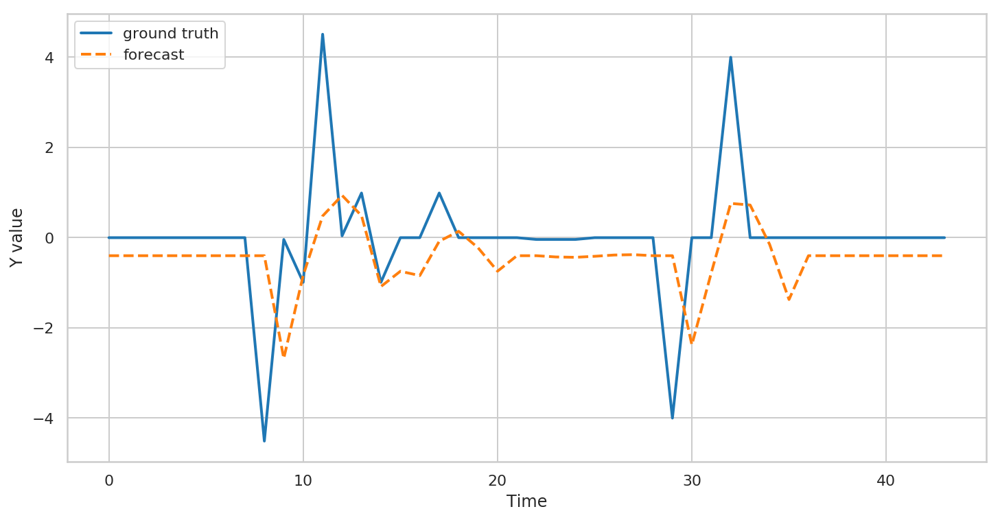

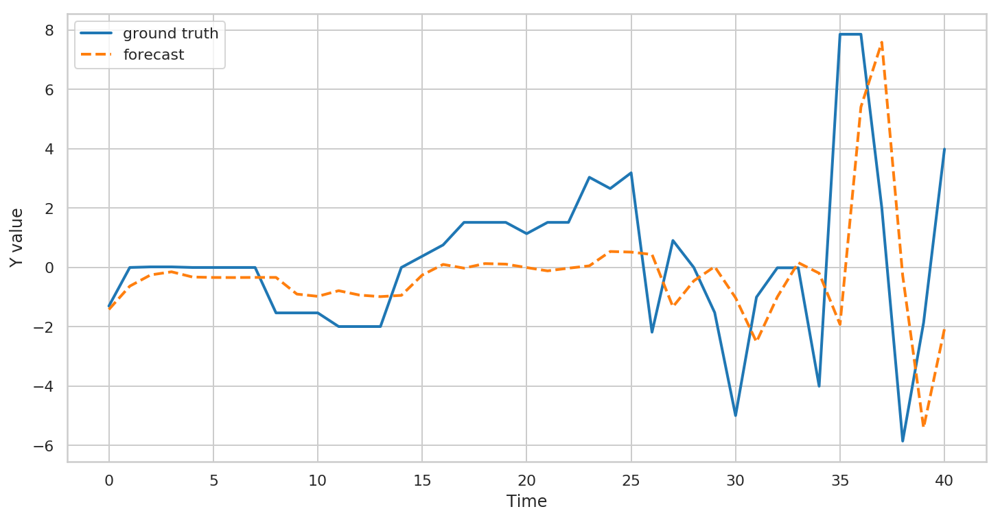

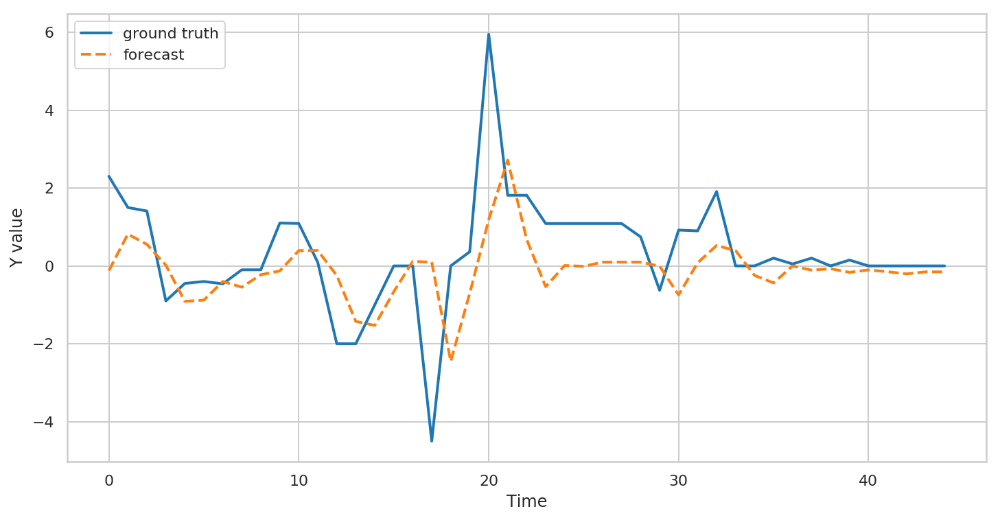

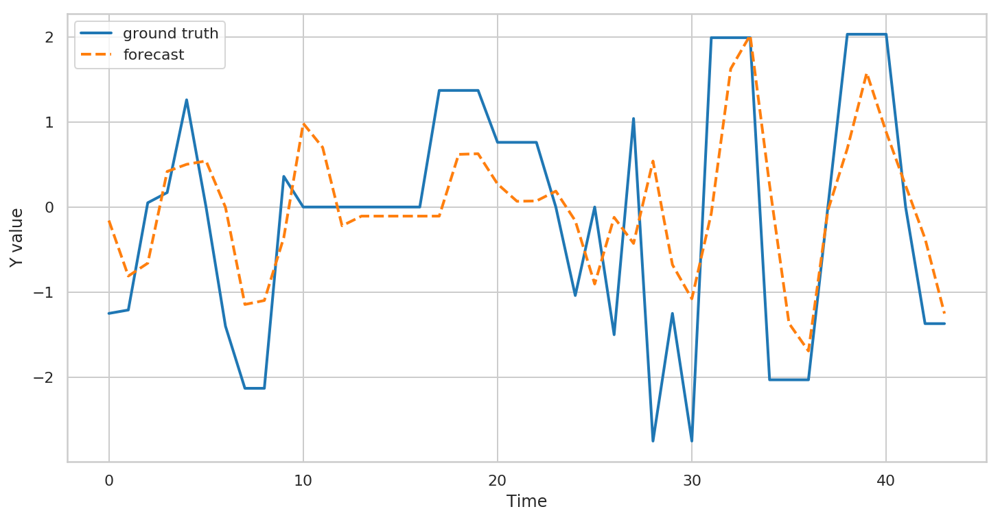

...

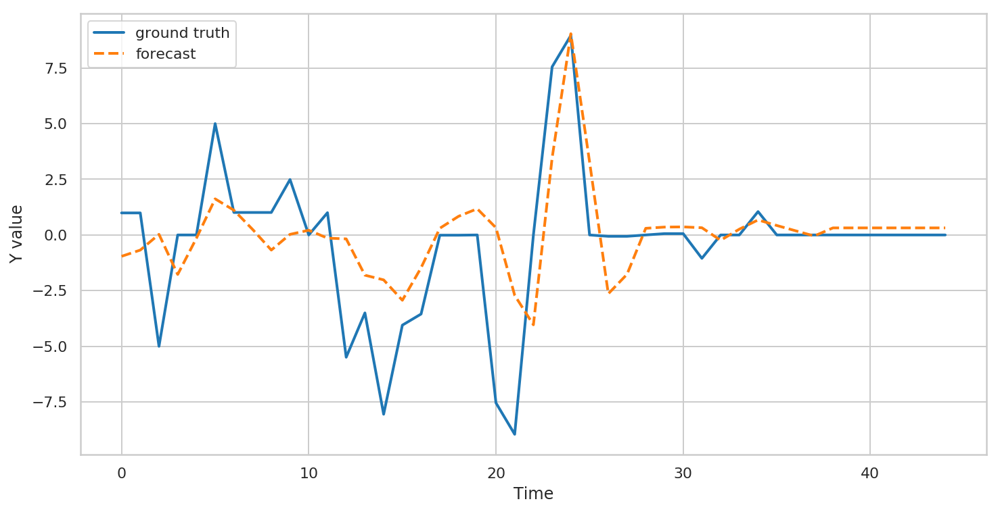

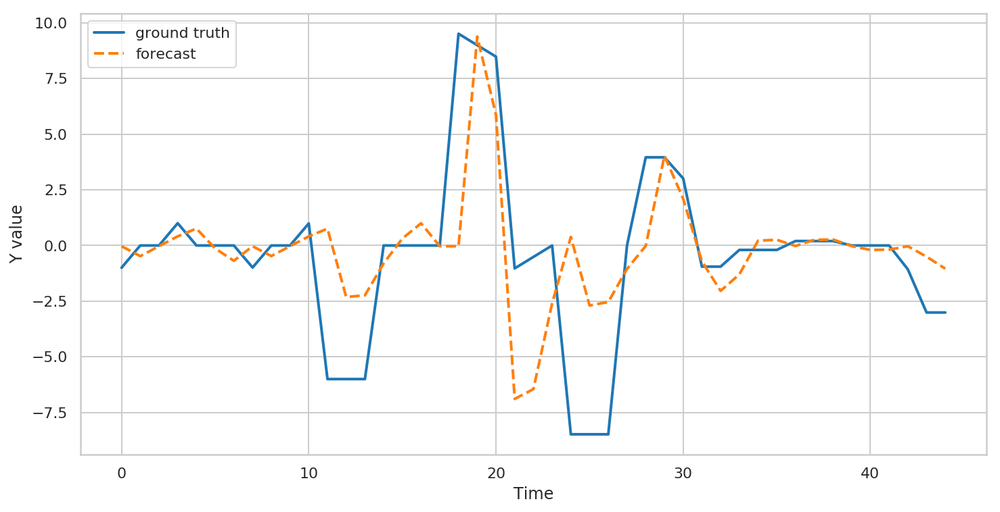

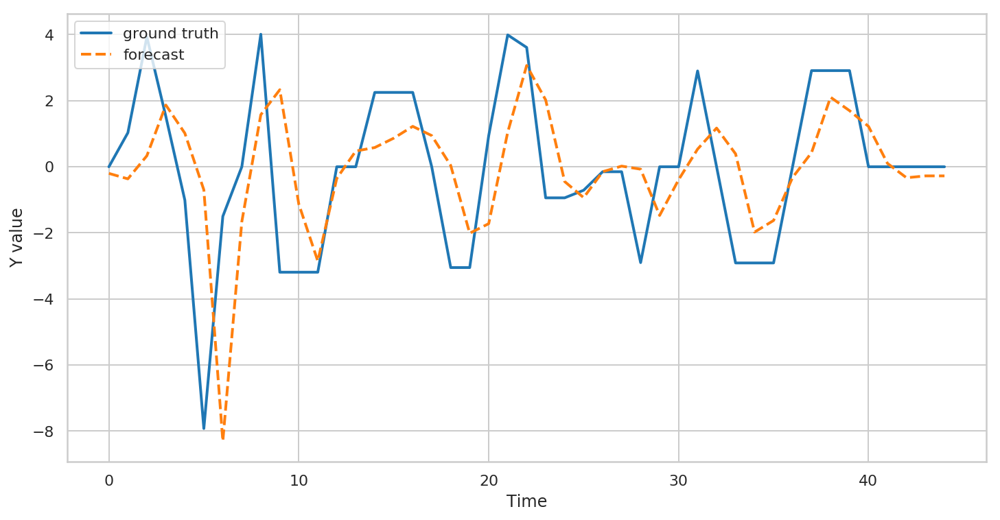

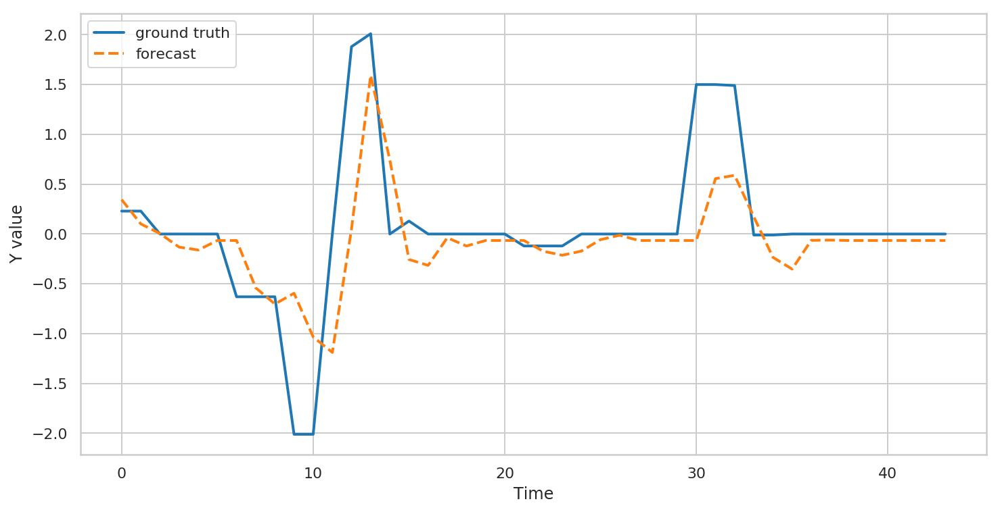

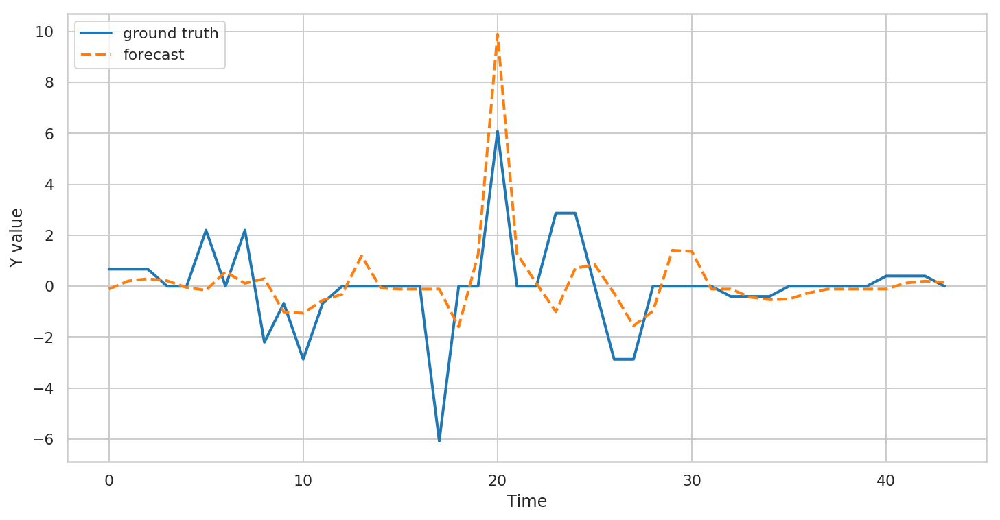

In [ ]:
metricDF_newprice_3D_lstm = [lstm_vanilla(i, "newprice_3D", 3, 1, 50) for i in panel_200.index.get_level_values('id').unique().values]
with open('/gdrive/My Drive/metric_newprice_3D_lstm.pkl', 'wb') as file:
    pickle.dump(pd.concat(metricDF_newprice_3D_lstm), file)


Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


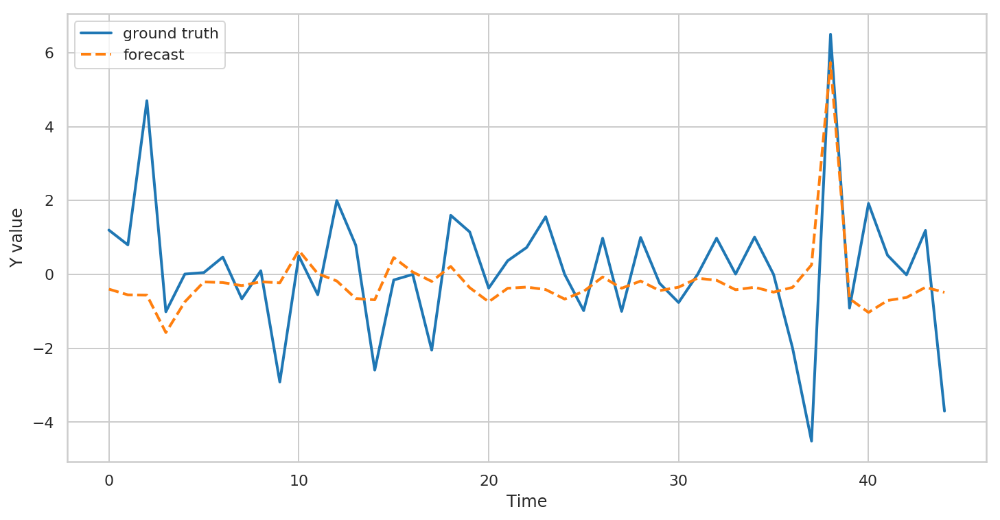

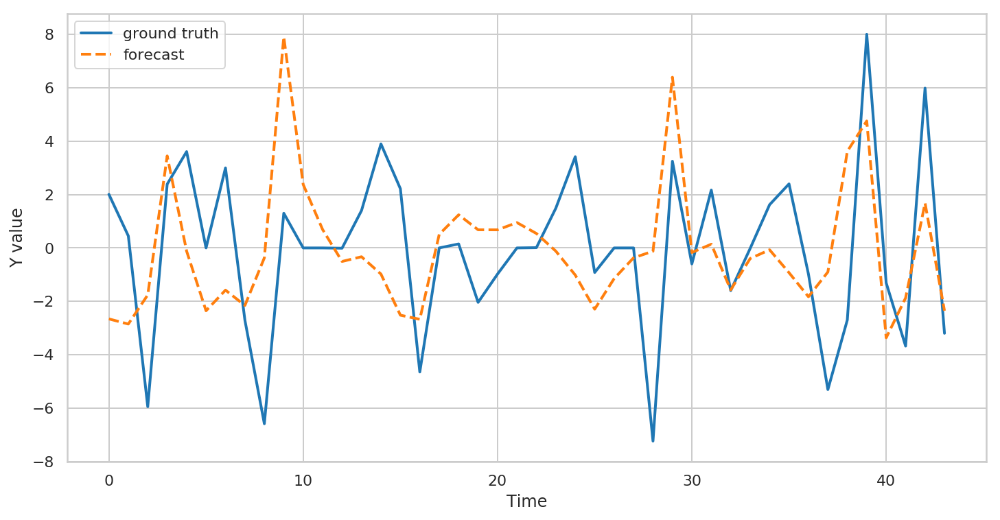

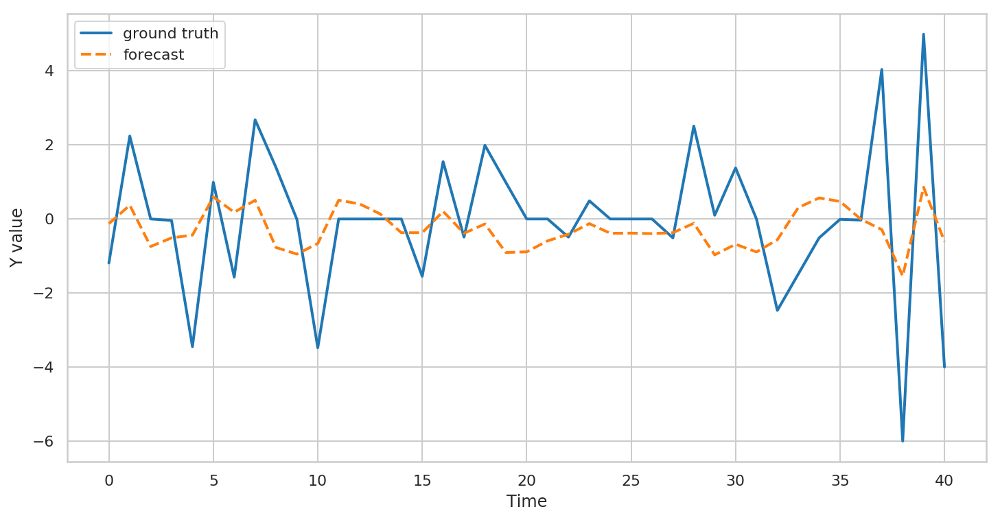

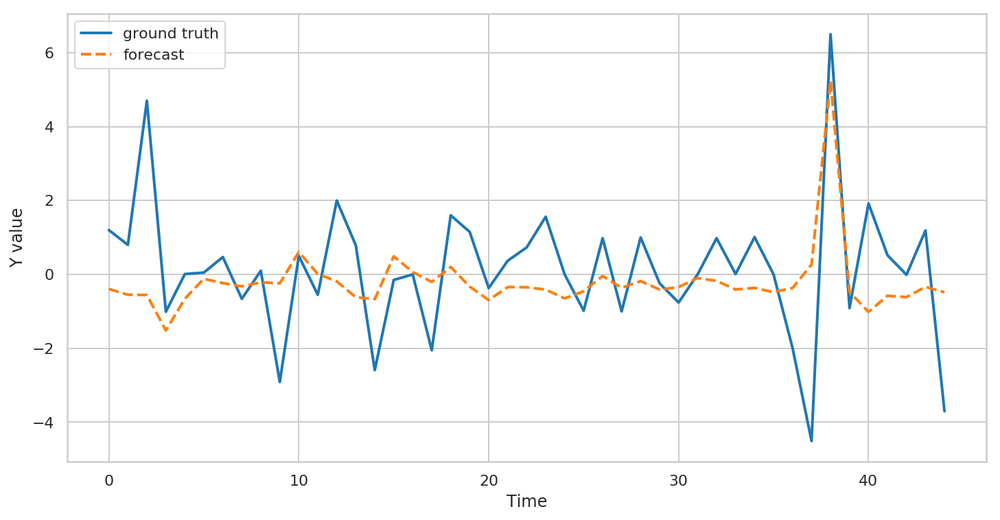

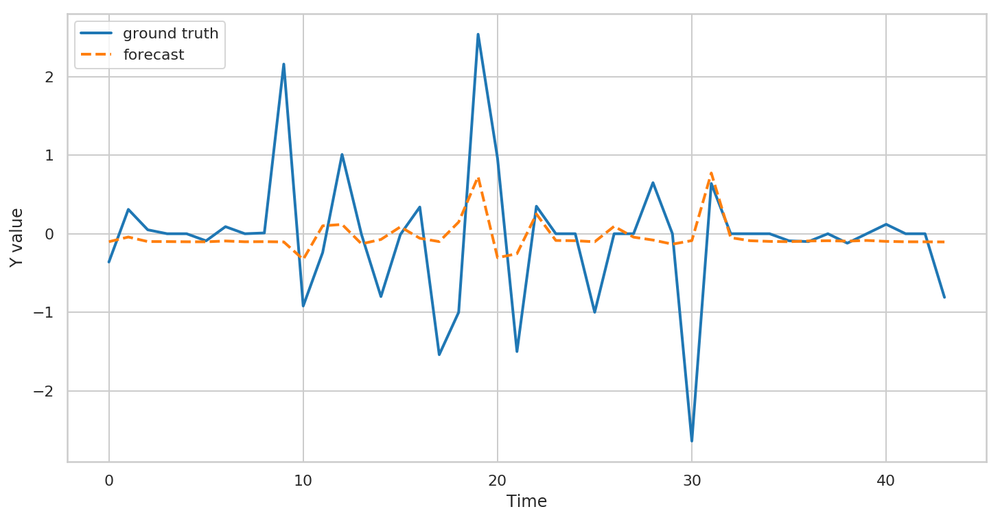

...

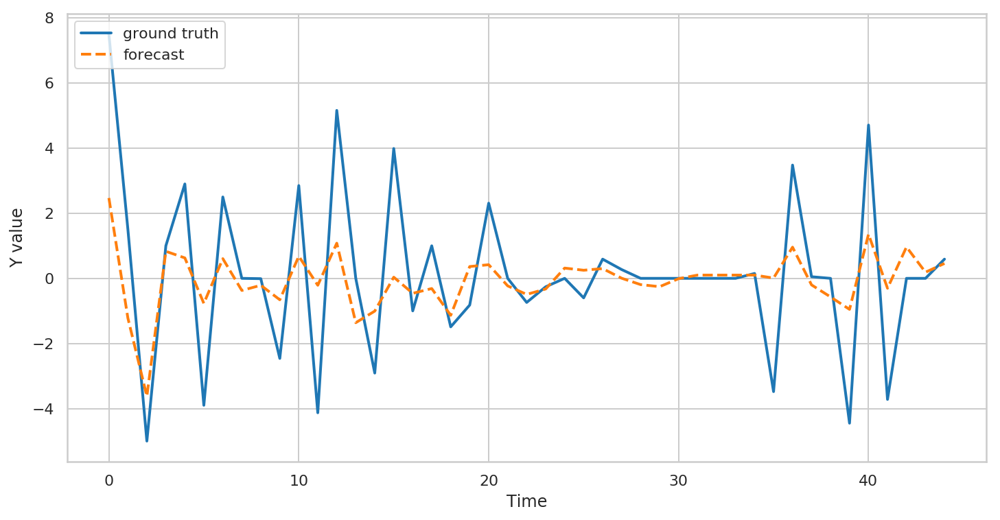

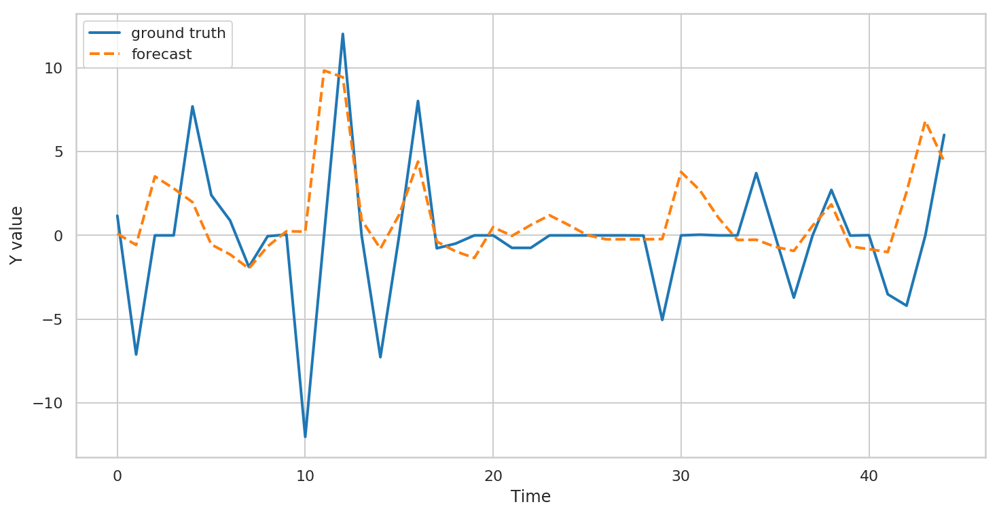

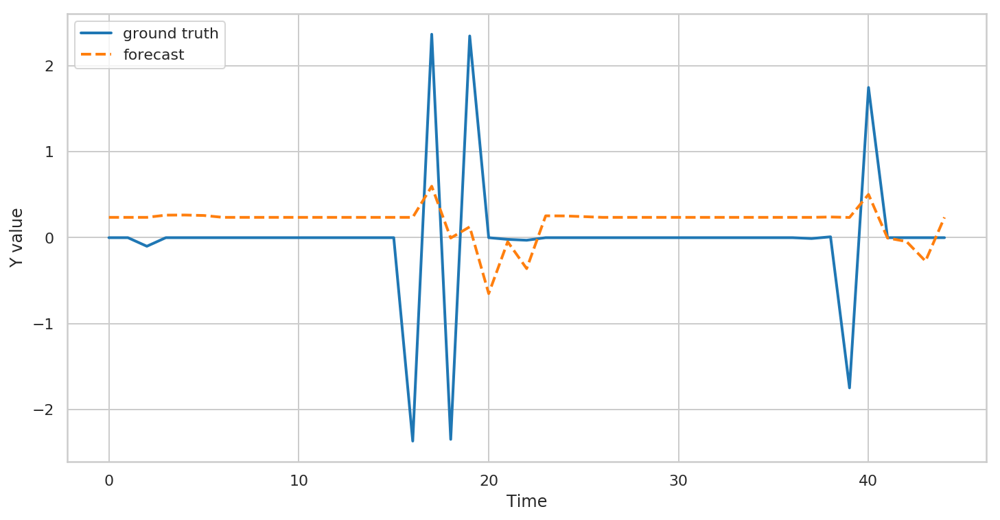

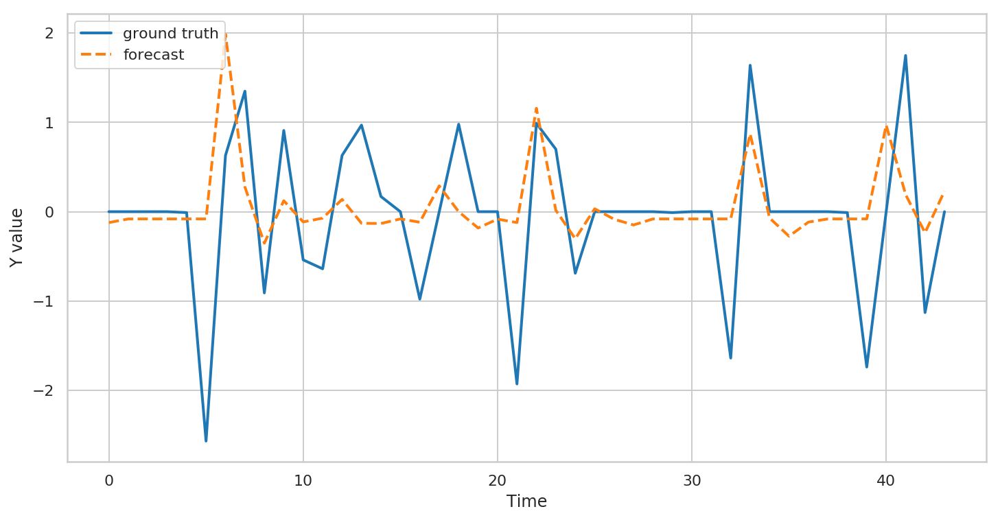

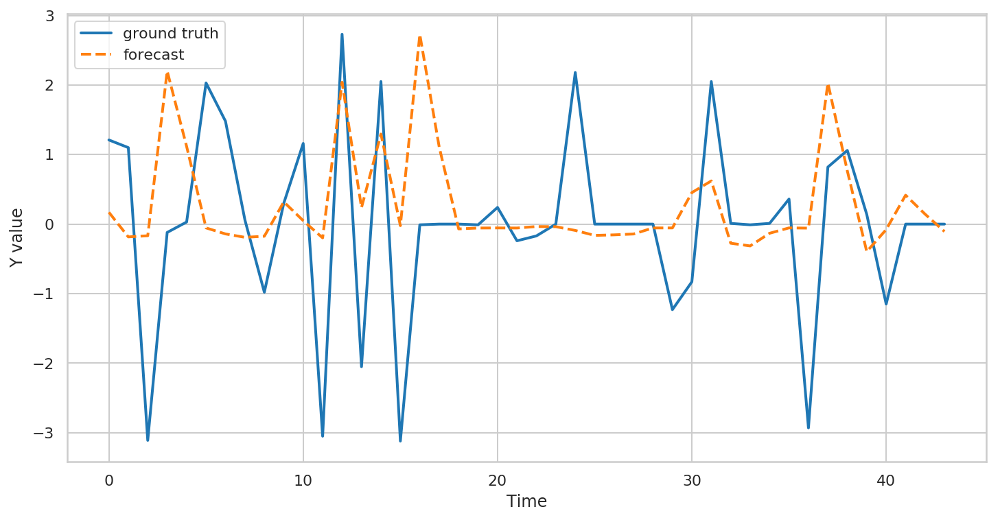

In [ ]:

metricDF_usedprice_1D_lstm = [lstm_vanilla(i, "usedprice_1D", 3, 1, 50) for i in panel_200.index.get_level_values('id').unique().values]
with open('/gdrive/My Drive/metric_usedprice_1D_lstm.pkl', 'wb') as file:
    pickle.dump(pd.concat(metricDF_usedprice_1D_lstm), file)


Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


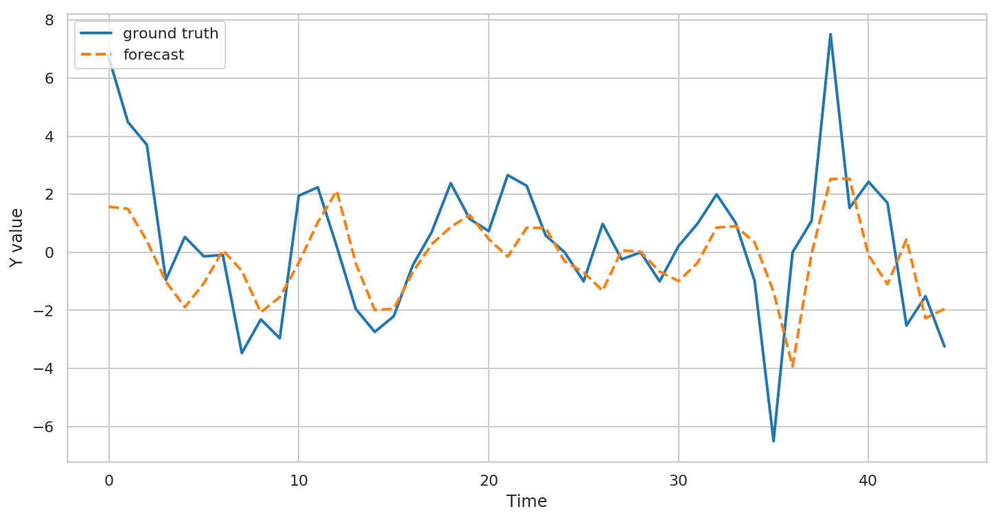

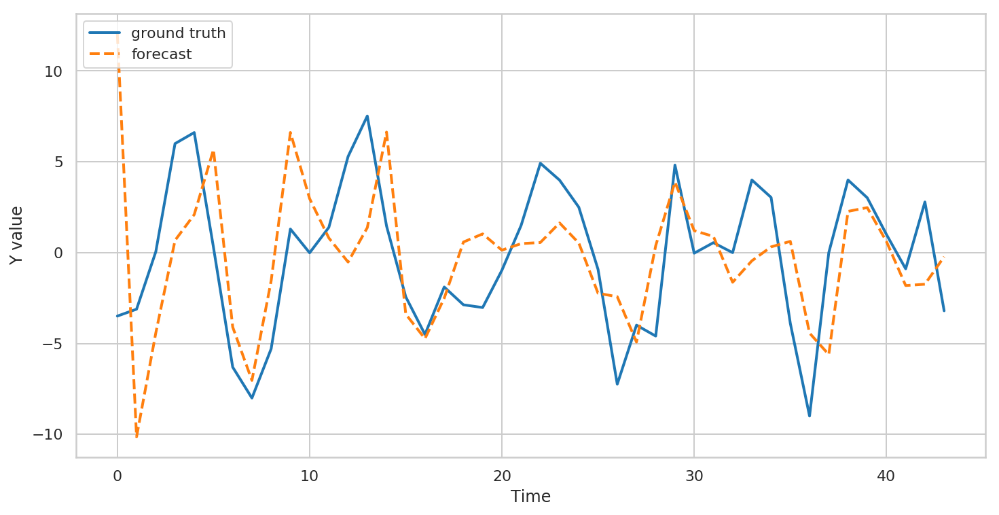

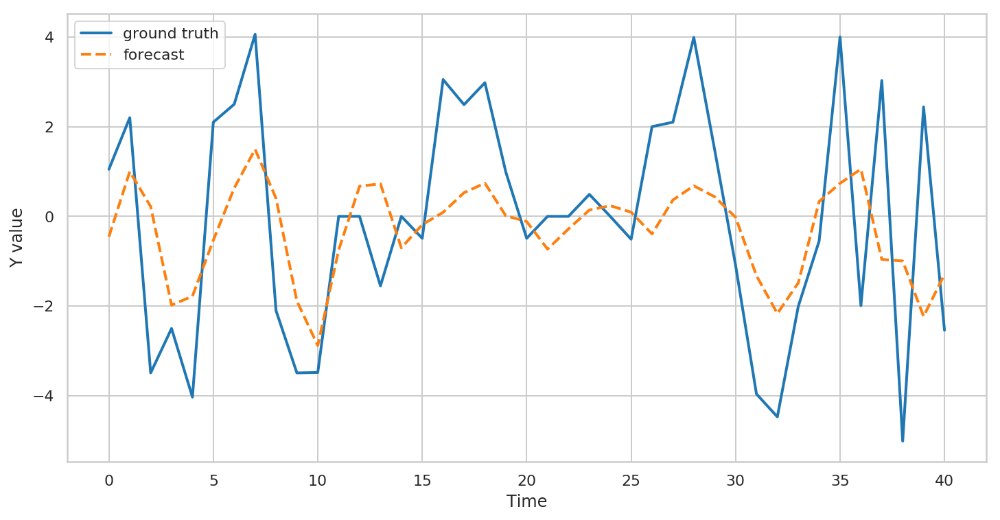

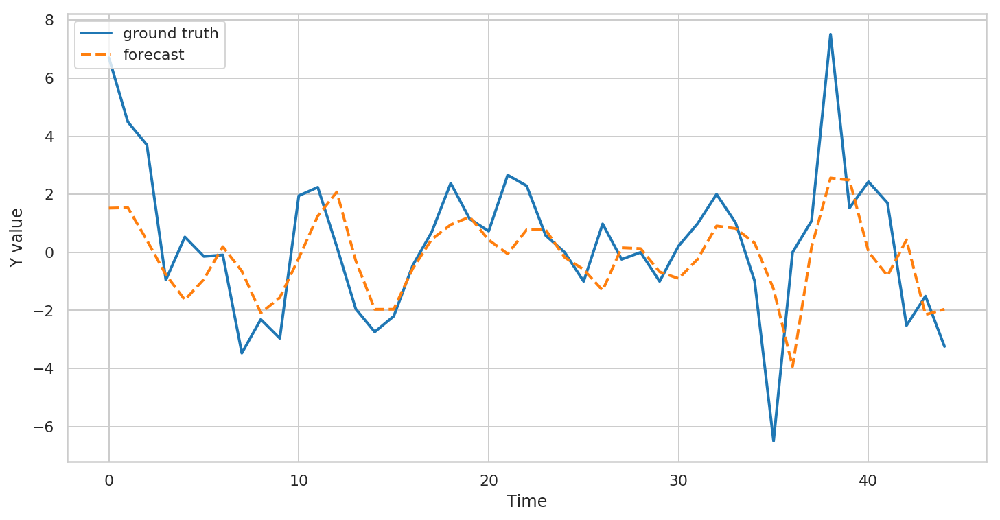

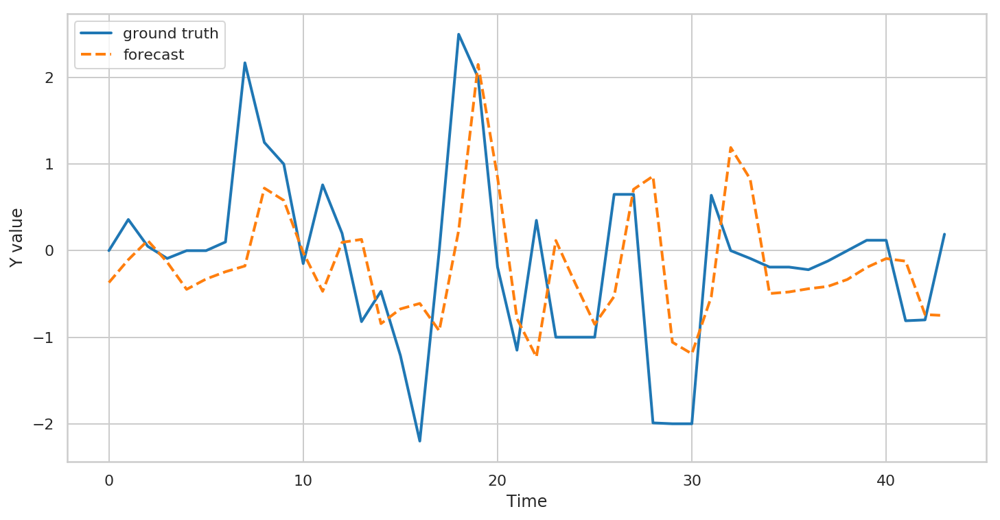

...

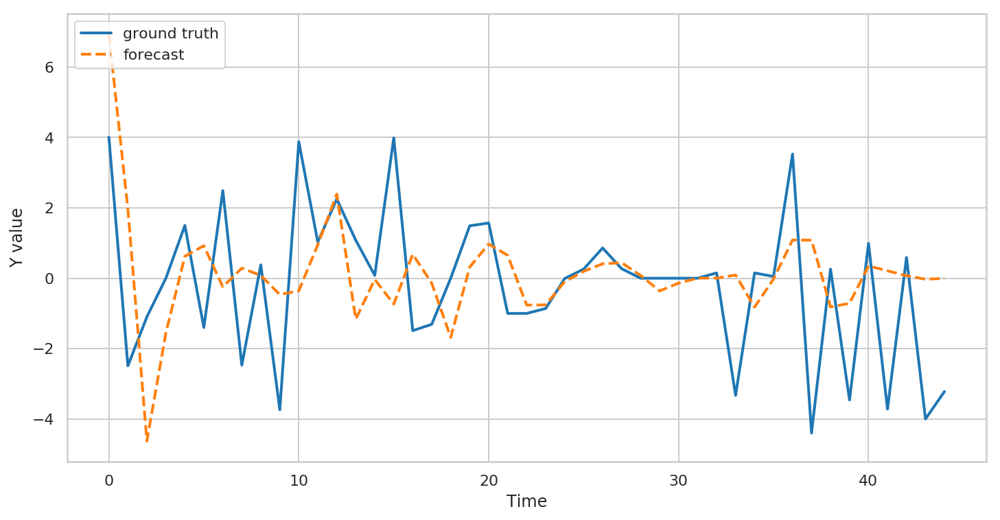

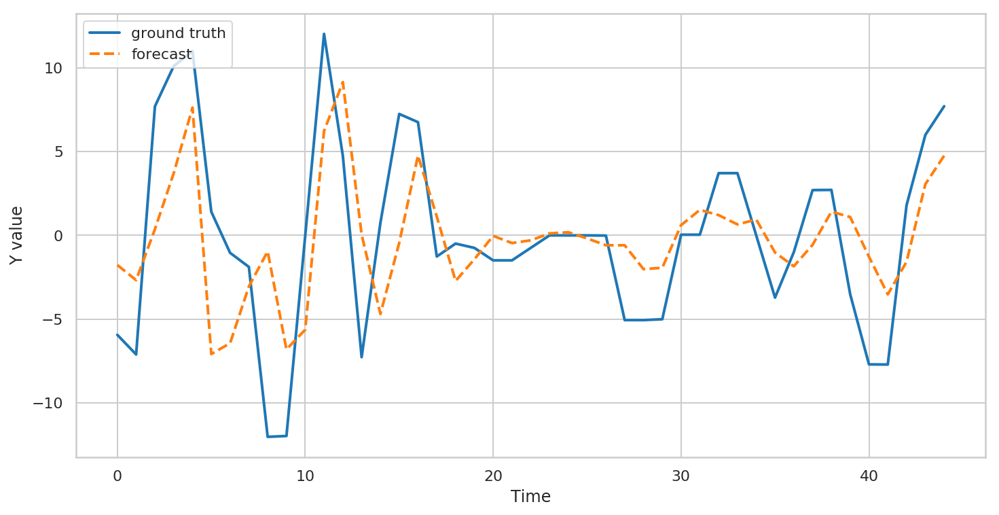

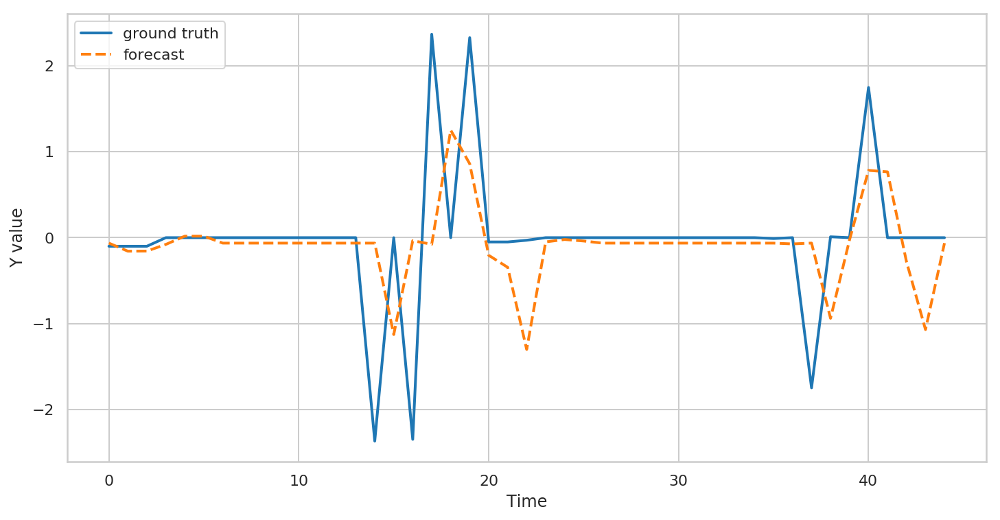

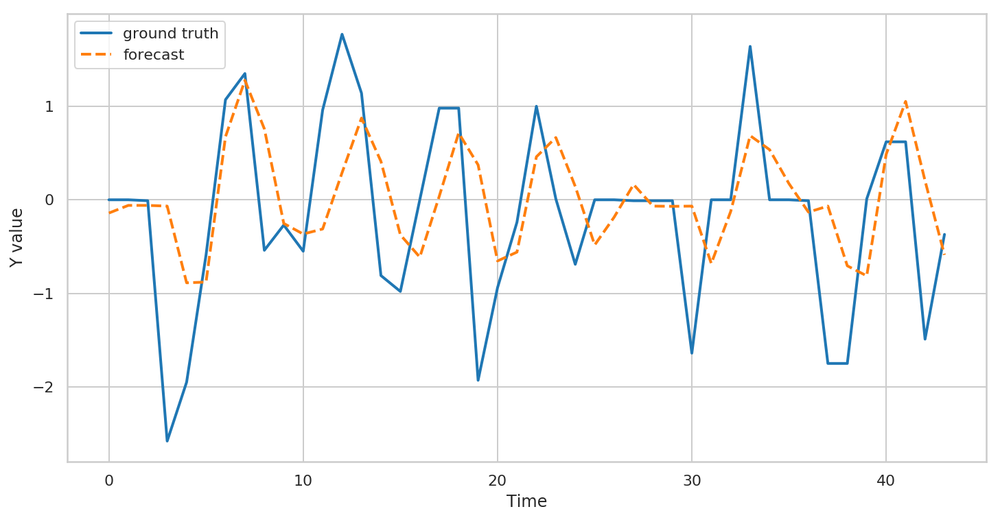

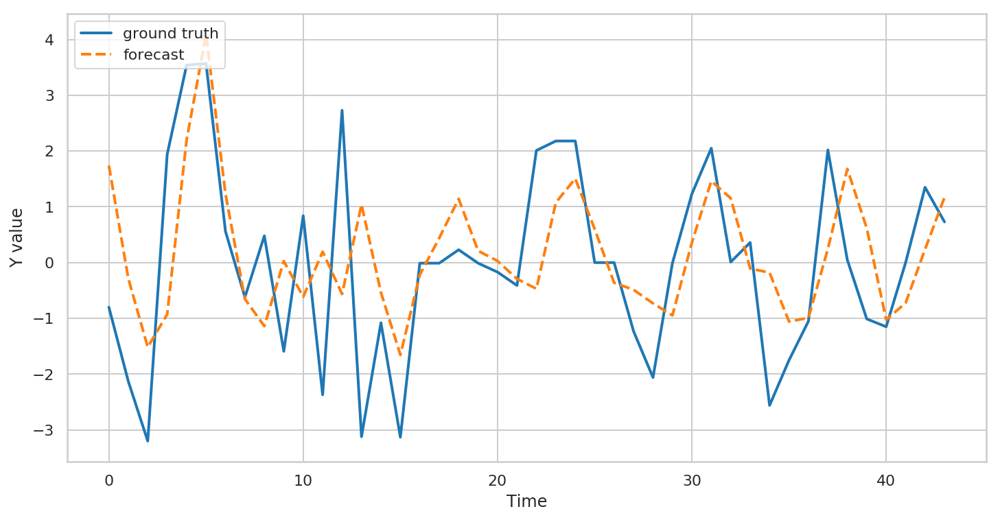

In [ ]:
metricDF_usedprice_3D_lstm = [lstm_vanilla(i, "usedprice_3D", 3, 1, 50) for i in panel_200.index.get_level_values('id').unique().values]
with open('/gdrive/My Drive/metric_usedprice_3D_lstm.pkl', 'wb') as file:
    pickle.dump(pd.concat(metricDF_usedprice_3D_lstm), file)

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Training .......... 

Predicting .......... 



/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


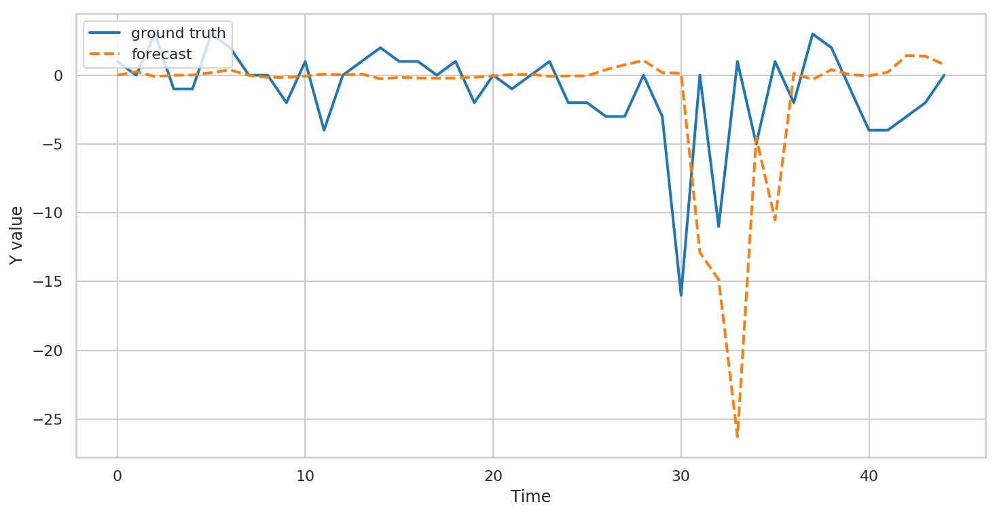

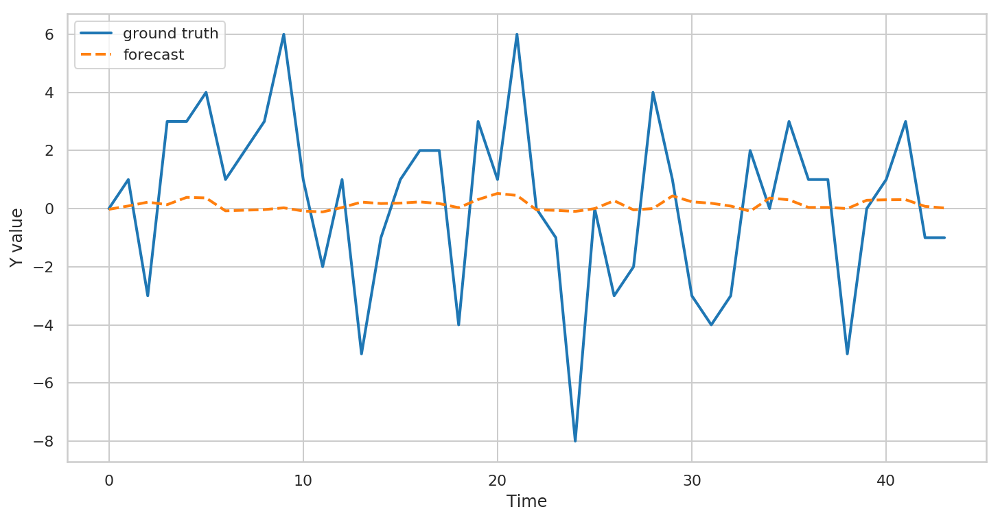

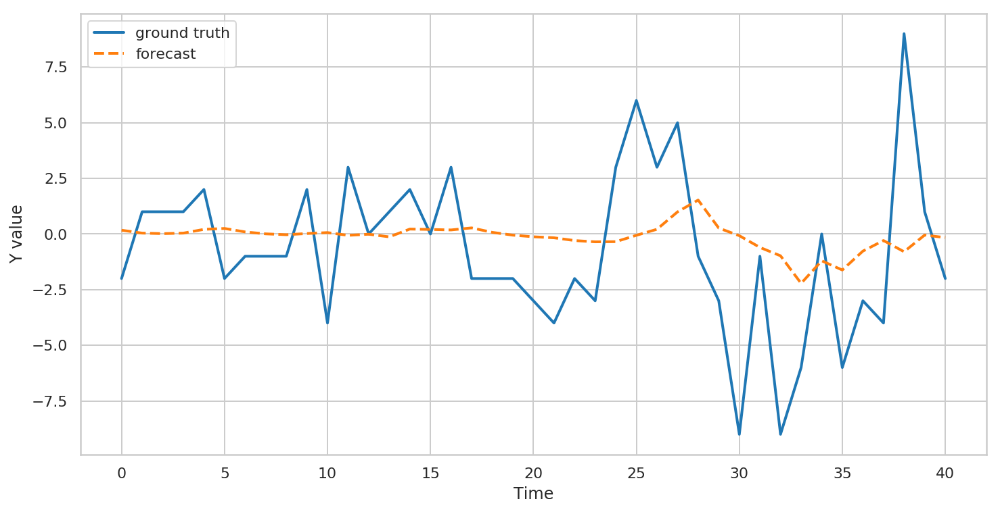

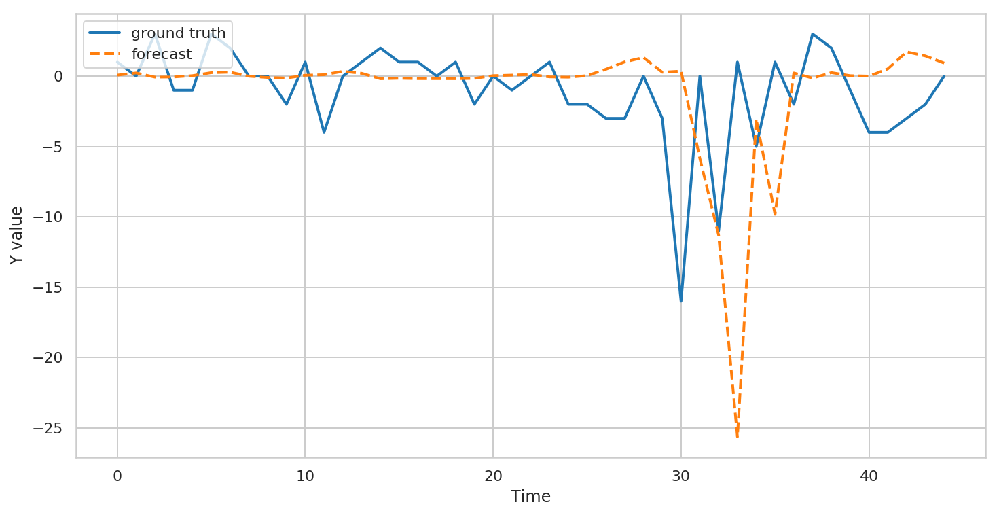

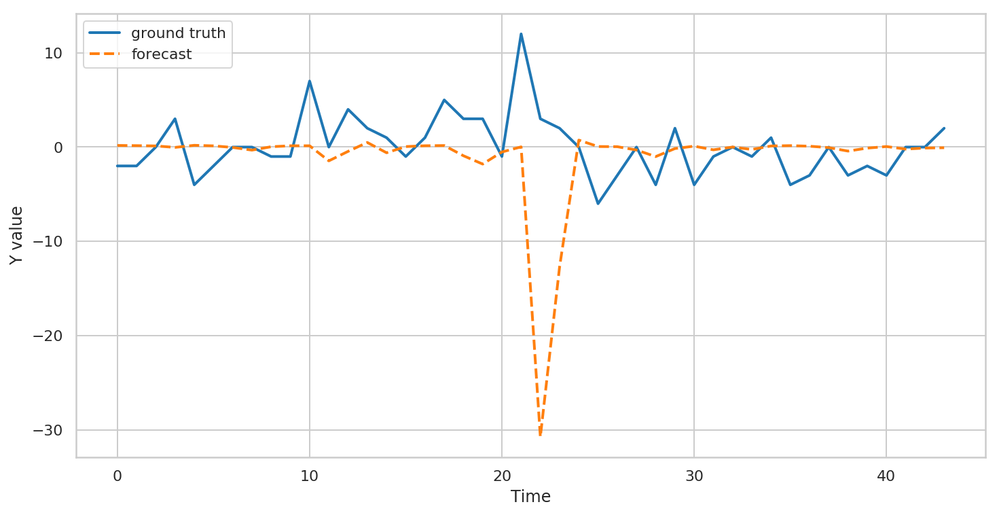

...

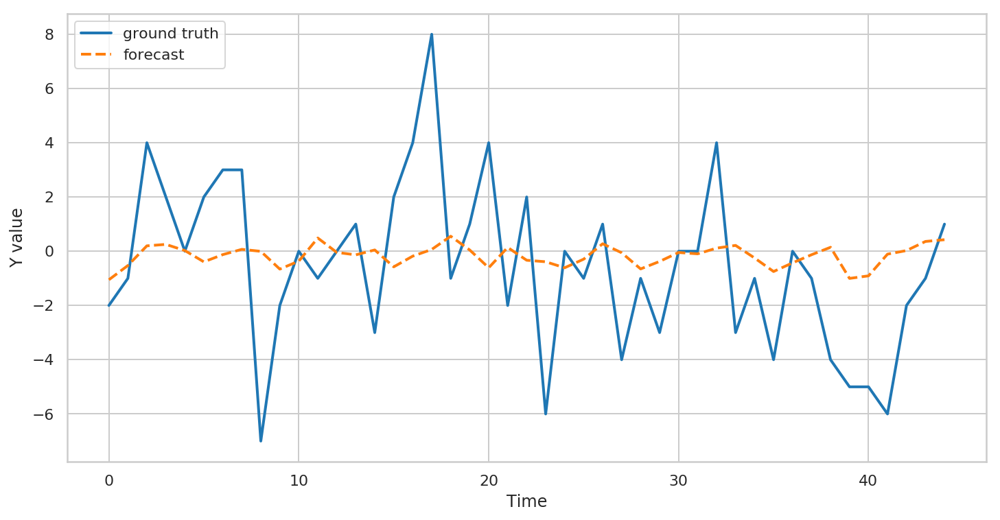

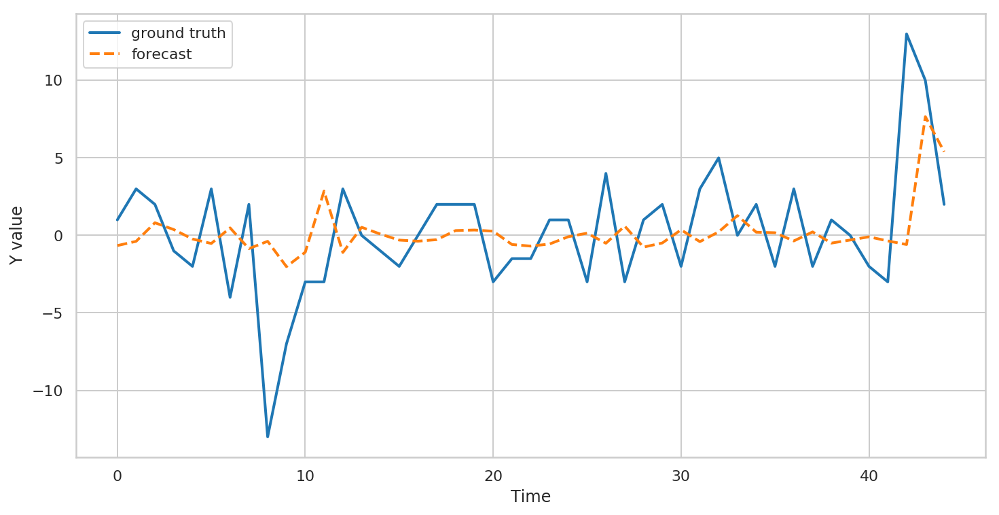

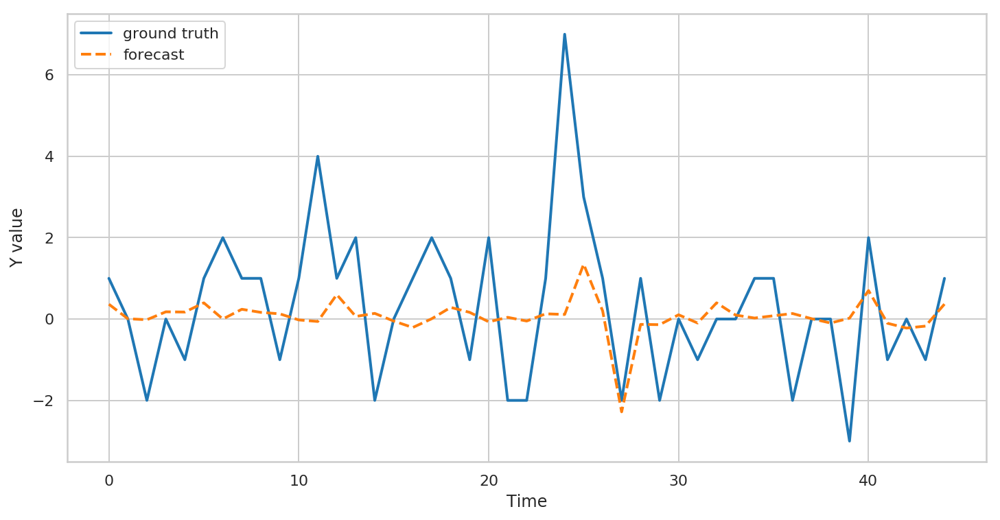

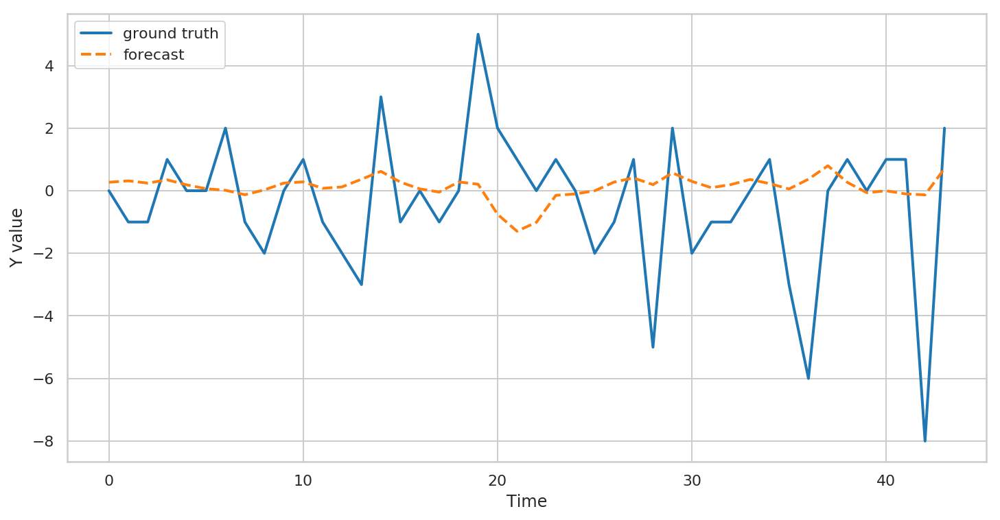

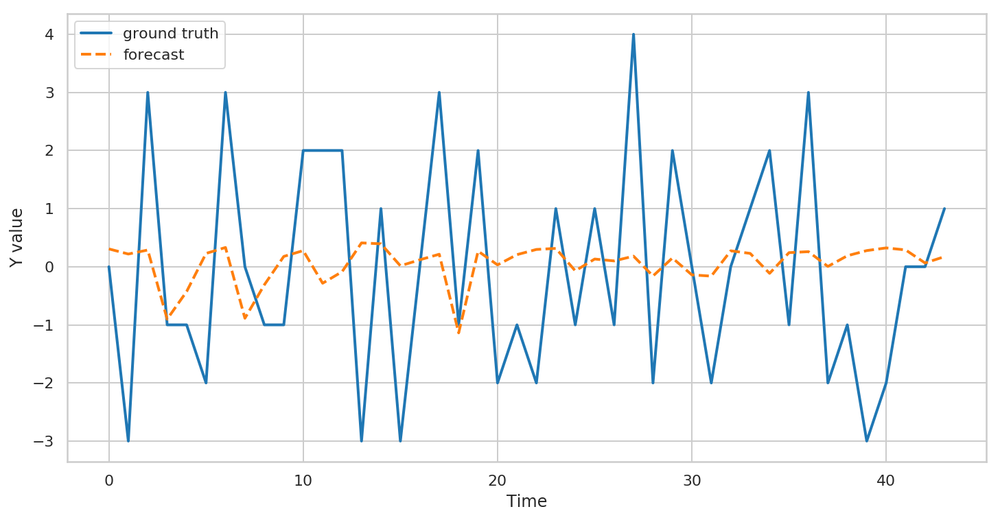

In [ ]:
metricDF_newstock_1D_lstm = [lstm_vanilla(i, "newstock_1D", 3, 1, 50) for i in panel_200.index.get_level_values('id').unique().values]
with open('/gdrive/My Drive/metric_newstock_1D_lstm.pkl', 'wb') as file:
    pickle.dump(pd.concat(metricDF_newstock_1D_lstm), file)

In [ ]:
metricDF_newstock_3D_lstm = [lstm_vanilla(i, "newstock_3D", 3, 1, 50) for i in panel_200.index.get_level_values('id').unique().values]
with open('/gdrive/My Drive/metric_newstock_3D_lstm.pkl', 'wb') as file:
    pickle.dump(pd.concat(metricDF_newstock_3D_lstm), file)

W0724 16:06:33.083133 140302972348288 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0724 16:06:33.108013 140302972348288 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0724 16:06:33.112384 140302972348288 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0724 16:06:33.479898 140302972348288 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:133: The name tf.placeholder_with_default is deprecated. Please use tf.compat.v1.placeholder_with_default instead.

W0724 16:06:33.488054 

Training .......... 



W0724 16:06:34.358973 140302972348288 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/math_grad.py:1250: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
W0724 16:06:36.411555 140302972348288 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:986: The name tf.assign_add is deprecated. Please use tf.compat.v1.assign_add instead.



Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 



In [ ]:
metricDF_usedstock_1D_lstm = [lstm_vanilla(i, "usedstock_1D", 3, 1, 50) for i in panel_200.index.get_level_values('id').unique().values]
with open('/gdrive/My Drive/metric_usedstock_1D_lstm.pkl', 'wb') as file:
    pickle.dump(pd.concat(metricDF_usedstock_1D_lstm), file)


In [ ]:
metricDF_usedstock_3D_lstm = [lstm_vanilla(i, "usedstock_3D", 3, 1, 50) for i in panel_200.index.get_level_values('id').unique().values]
with open('/gdrive/My Drive/metric_usedstock_3D_lstm.pkl', 'wb') as file:
    pickle.dump(pd.concat(metricDF_usedstock_3D_lstm), file)

In [ ]:
def lstm_EnDecode(entity, y_name, n_steps, n_features, n_epochs):

    df_single = panel_200.query(f"id == {entity}").droplevel(0, axis=0).copy()
    
#     X_train = df_single.iloc[:round(0.8*df_single.shape[0]), 0].values
#     X_test = df_single.iloc[round(0.8*df_single.shape[0]):, 0].values
    
    target_train = df_single.iloc[: round(0.8 * df_single.shape[0]),
                                 df_single.columns.get_loc(y_name)]
    target_test = df_single.iloc[round(0.8 * df_single.shape[0]) :, 
                                df_single.columns.get_loc(y_name)]
    
    def split_sequence(sequence, n_steps_in, n_steps_out=1):
        X, y = list(), list()
        for i in range(len(sequence)):
            # find the end of this pattern
            end_ix = i + n_steps_in
            out_end_ix = end_ix + n_steps_out
            # check if we are beyond the sequence
            if out_end_ix > len(sequence):
                break
            # gather input and output parts of the pattern
            seq_x, seq_y = sequence[i:end_ix], sequence[end_ix:out_end_ix]
            X.append(seq_x)
            y.append(seq_y)
        return array(X), array(y)

    X, y = split_sequence(target_train, n_steps)
    X = X.reshape((X.shape[0], X.shape[1], n_features))
    y = y.reshape((y.shape[0], y.shape[1], n_features))
    # define model
    model = Sequential()
    model.add(Bidirectional(LSTM(200, activation='relu',),
                            input_shape=(n_steps, n_features)))
    model.add(Dropout(0.3))
    model.add(RepeatVector(1))
    model.add(Bidirectional(LSTM(200, activation='relu', return_sequences=True),
                            input_shape=(n_steps, n_features)))
    model.add(Dropout(0.3))
    model.add(TimeDistributed(Dense(1)))
    model.compile(optimizer='adam', loss='mse')
    
    print("Training", '.'*10, '\n')
    model.fit(X, y, epochs=n_epochs, verbose=0)
    
    X_test, y_test = split_sequence(np.concatenate((target_train[-n_steps:], target_test), axis=0), n_steps)
    X_test = X_test.reshape((X_test.shape[0], n_steps, n_features))
    print("Predicting", '.'*10, '\n')
    y_pred = model.predict(X_test, verbose=0)
    
    y_pred = y_pred.reshape((y_pred.shape[0], ))
    y_test = y_test.reshape((y_test.shape[0], ))
    
    
    metric_dict = defaultdict(list)
    
    metric_dict["EXP_VAR"] = explained_variance_score(
        y_test, y_pred
    )
    metric_dict["MAE"] = mean_absolute_error(y_test, y_pred)
    metric_dict["MSE"] = mean_squared_error(y_test, y_pred)

    metric_df = pd.DataFrame(metric_dict, index=[y_name])

    
    

    def lstm_plot(y_test, y_pred):
        colors = sns.color_palette()
        c1, c2 = colors[0], colors[1]
        fig = plt.figure(figsize=(12, 6))
        ax = fig.add_subplot(1, 1, 1)
        ax.plot(y_test, lw=2, color=c1, label="ground truth")
        ax.plot(y_pred, lw=2, ls="--", color=c2, label="forecast")
        # ax.axvline(time_index[-num_forecast_steps], linestyle="--")
        ax.legend(loc="upper left")
        ax.set_ylabel("Y value")
        ax.set_xlabel("Time")
        fig

    lstm_plot(y_test, y_pred)
    
    return metric_df

Training .......... 

Predicting .......... 



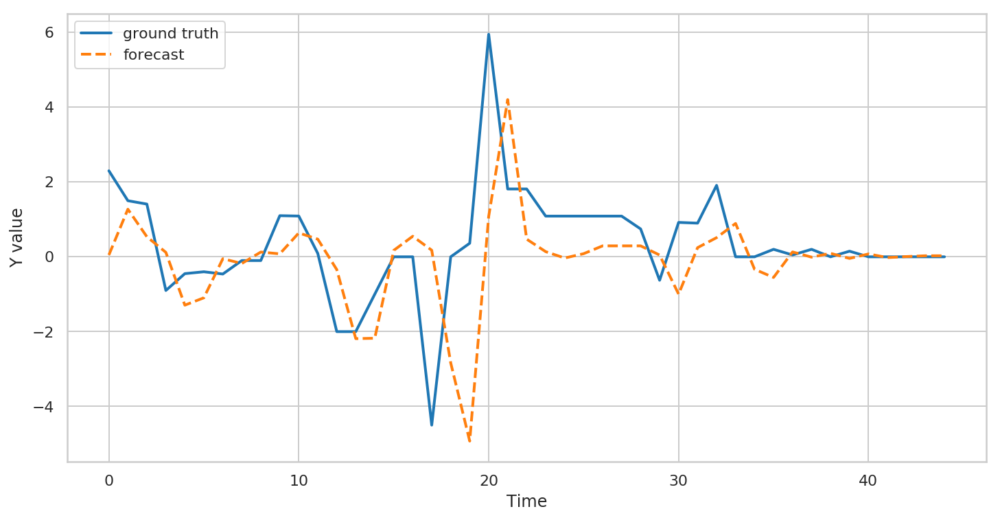

In [ ]:
tmp_metric_1 = lstm_EnDecode(1, 'newprice_3D', n_steps=3, n_features=1, n_epochs=100)

In [ ]:
tmp_metric_1

,EXP_VAR,MAE,MSE
newprice_3D,-0.174441,1.024453,2.579094


In [ ]:
newprice_1D_train = df_single.iloc[:round(0.8*df_single.shape[0]), 13].values
newprice_1D_test = df_single.iloc[round(0.8*df_single.shape[0]):, 13].values

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 

Training .......... 

Predicting .......... 



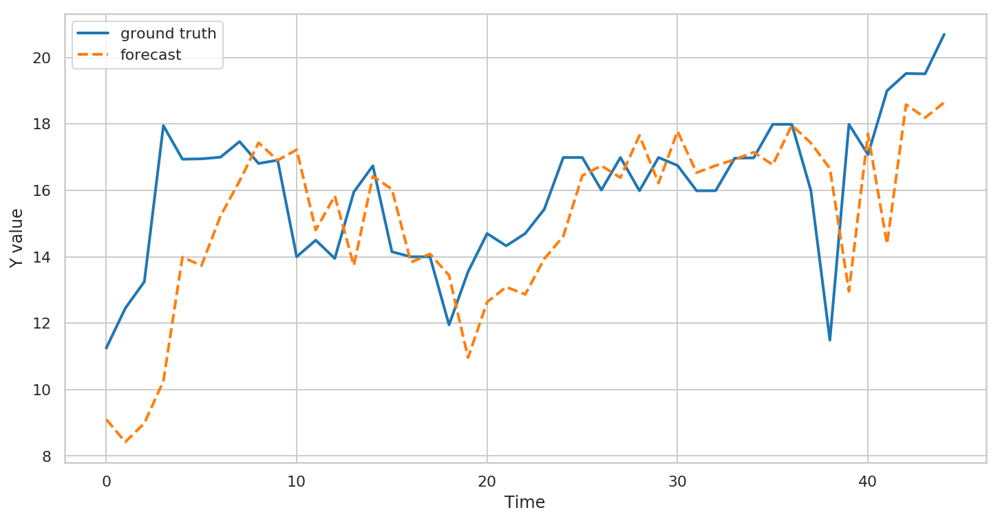

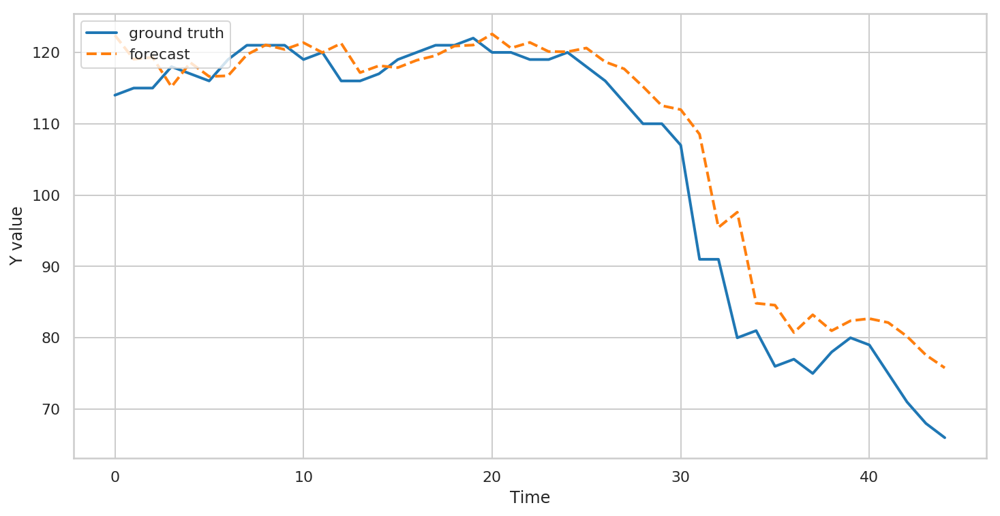

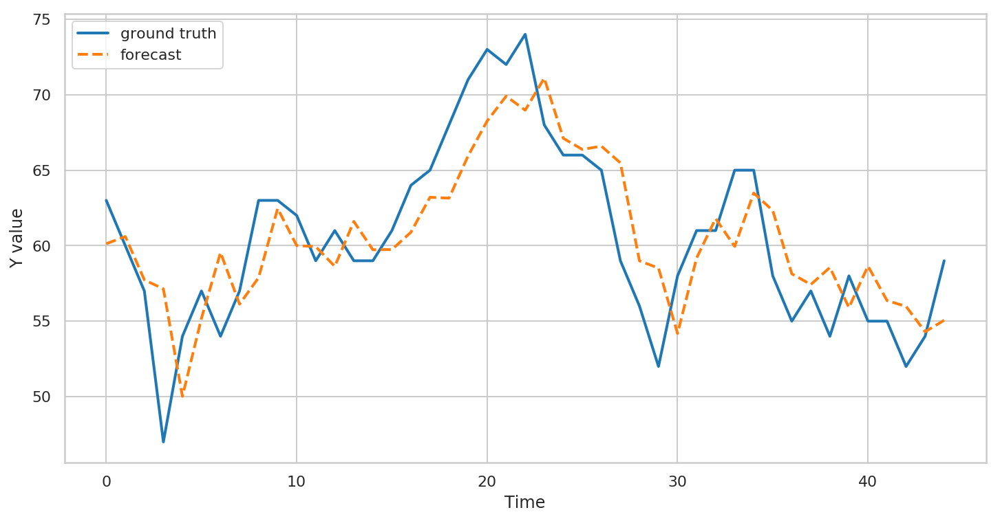

In [ ]:
lstm_vanilla(oldprice_train, oldprice_test, n_steps=7, n_features=1, n_epochs=200)
lstm_vanilla(newstock_train, newstock_test, n_steps=7, n_features=1, n_epochs=200)
lstm_vanilla(oldstock_train, oldstock_test, n_steps=7, n_features=1, n_epochs=200)

In [ ]:
def lstm_EnDeCode(input_train, input_test, n_steps, n_features, n_epochs):


    # split a univariate sequence into samples
    def split_sequence(sequence, n_steps):
        X, y = list(), list()
        for i in range(len(sequence)):
            # find the end of this pattern
            end_ix = i + n_steps
            # check if we are beyond the sequence
            if end_ix > len(sequence)-1:
                break
            # gather input and output parts of the pattern
            seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
            X.append(seq_x)
            y.append(seq_y)
        return array(X), array(y)

    X, y = split_sequence(input_train, n_steps)
    X = X.reshape((X.shape[0], X.shape[1], n_features))
    y = y.reshape((y.shape[0], y.shape[1], 1))
    # define model
    model = Sequential()
    model.add(LSTM(200, activation='relu', input_shape=(n_steps, n_features)))
    model.add(RepeatVector(1))
    model.add(LSTM(200, activation='relu', return_sequences=True))
    model.add(TimeDistributed(Dense(1)))
    model.compile(optimizer='adam', loss='mse')
    
    print("Training", '.'*10, '\n')
    model.fit(X, y, epochs=n_epochs, verbose=0)
    
    X_test, y_test = split_sequence(np.concatenate((input_train[-n_steps:],input_test), axis=0), n_steps)
    X_test = X_test.reshape((X_test.shape[0], n_steps, n_features))
    print("Predicting", '.'*10, '\n')
    y_pred = model.predict(X_test, verbose=0)
    
    y_pred = y_pred.reshape((y_pred.shape[0], ))

    def lstm_plot(y_test, y_pred):
        colors = sns.color_palette()
        c1, c2 = colors[0], colors[1]
        fig = plt.figure(figsize=(12, 6))
        ax = fig.add_subplot(1, 1, 1)
        ax.plot(y_test, lw=2, color=c1, label="ground truth")
        ax.plot(y_pred, lw=2, ls="--", color=c2, label="forecast")
        # ax.axvline(time_index[-num_forecast_steps], linestyle="--")
        ax.legend(loc="upper left")
        ax.set_ylabel("Y value")
        ax.set_xlabel("Time")
        fig

    lstm_plot(y_test, y_pred)

In [ ]:
lstm_EnDeCode(newprice_train, newprice_test, n_steps=7, n_features=1, n_epochs=200)

Training .......... 



ValueError: ignored

In [ ]:
newprice_train

array([34.95  , 36.99  , 37.79  , 35.95  , 35.95  , 33.98  , 32.22  ,
       34.48  , 29.99  , 29.99  , 29.99  , 29.99  , 28.49  , 24.99  ,
       28.49  , 28.49  , 28.48  , 28.49  , 28.49  , 28.49  , 28.49  ,
       28.49  , 28.49  , 28.49  , 28.49  , 28.49  , 28.49  , 28.    ,
       28.    , 28.    , 28.    , 27.99  , 27.99  , 27.99  , 27.84  ,
       28.    , 31.4725, 32.63  , 29.89  , 28.64  , 28.64  , 29.5   ,
       29.5   , 29.5   , 29.5   , 29.5   , 29.5   , 27.84  , 24.95  ,
       24.95  , 27.84  , 27.5   , 27.84  , 27.84  , 30.99  , 31.99  ,
       31.99  , 31.99  , 30.95  , 30.95  , 30.95  , 30.49  , 30.49  ,
       30.49  , 30.49  , 30.49  , 29.88  , 27.88  , 27.87  , 27.46  ,
       27.46  , 27.46  , 27.99  , 27.99  , 28.4   , 28.    , 28.    ,
       28.    , 29.9   , 26.99  , 26.99  , 25.99  , 25.99  , 25.89  ,
       25.89  , 25.87  , 25.87  , 25.87  , 25.87  , 25.    , 27.99  ,
       28.99  , 25.99  , 25.99  , 25.99  , 25.97  , 25.97  , 25.99  ,
       25.99  , 25.9

In [ ]:
def lstm_cnn(input_train, input_test, n_steps, n_seq, n_features, n_epochs):
    
    # split a univariate sequence into samples
    def split_sequence(sequence, n_steps):
        X, y = list(), list()
        for i in range(len(sequence)):
            # find the end of this pattern
            end_ix = i + n_steps
            # check if we are beyond the sequence
            if end_ix > len(sequence)-1:
                break
            # gather input and output parts of the pattern
            seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
            X.append(seq_x)
            y.append(seq_y)
        return array(X), array(y)

    X, y = split_sequence(input_train, n_steps)
    X = X.reshape((X.shape[0], n_seq, int(n_steps/n_seq), n_features))

    model = Sequential()
    
    model.add(TimeDistributed(Conv1D(filters=64, kernel_size=1, activation='relu'), input_shape=(None, int(n_steps/n_seq), n_features)))
    model.add(TimeDistributed(MaxPooling1D(pool_size=2)))
    model.add(TimeDistributed(Flatten()))
    model.add(LSTM(50, activation='relu'))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    
    print("Training", '.'*10, '\n')
    model.fit(X, y, epochs=n_epochs, verbose=0)
    
    X_test, y_test = split_sequence(np.concatenate((input_train[-n_steps:],input_test), axis=0), n_steps)
    X_test = X_test.reshape((X_test.shape[0], n_seq, int(n_steps/n_seq), n_features))
    print("Predicting", '.'*10, '\n')
    y_pred = model.predict(X_test, verbose=0)

    def lstm_plot(y_test, y_pred):
        colors = sns.color_palette()
        c1, c2 = colors[0], colors[1]
        fig = plt.figure(figsize=(12, 6))
        ax = fig.add_subplot(1, 1, 1)
        ax.plot(y_test, lw=2, color=c1, label="ground truth")
        ax.plot(y_pred, lw=2, ls="--", color=c2, label="forecast")
        # ax.axvline(time_index[-num_forecast_steps], linestyle="--")
        ax.legend(loc="upper left")
        ax.set_ylabel("Y value")
        ax.set_xlabel("Time")
        fig

    lstm_plot(y_test, y_pred)

Training .......... 

Predicting .......... 



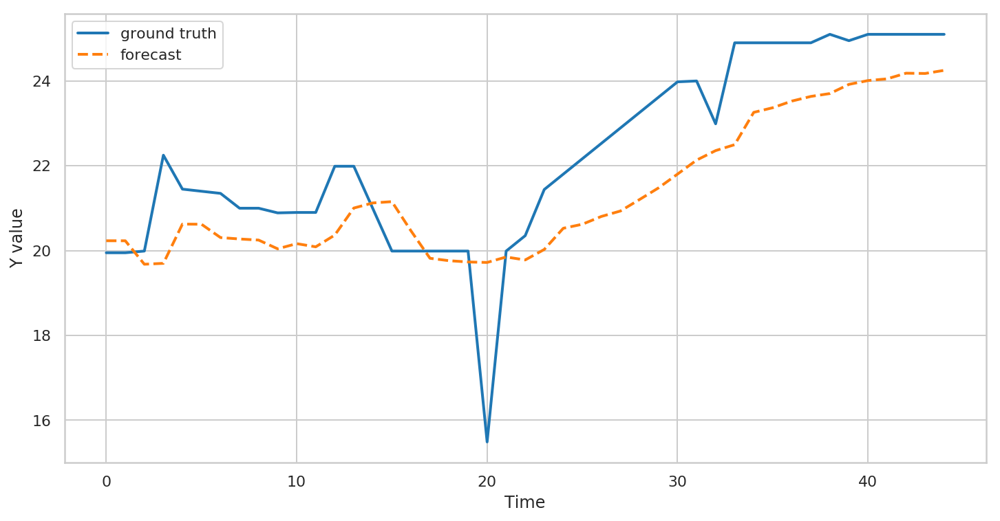

In [ ]:
lstm_cnn(newprice_train, newprice_test, n_steps=12, n_seq=3, n_features=1, n_epochs=500)

In [ ]:
def lstm_Conv(input_train, input_test, n_steps, n_seq, n_features, n_epochs):

    # split a univariate sequence into samples
    def split_sequence(sequence, n_steps):
        X, y = list(), list()
        for i in range(len(sequence)):
            # find the end of this pattern
            end_ix = i + n_steps
            # check if we are beyond the sequence
            if end_ix > len(sequence)-1:
                break
            # gather input and output parts of the pattern
            seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
            X.append(seq_x)
            y.append(seq_y)
        return array(X), array(y)

    X, y = split_sequence(input_train, n_steps)
    X = X.reshape((X.shape[0], n_seq, 1, int(n_steps/n_seq), n_features))

    model = Sequential()
    
    model.add(ConvLSTM2D(filters=64, kernel_size=(1,int(n_steps/n_seq)), 
                         activation='relu', 
                         input_shape=(n_seq, 1, int(n_steps/n_seq), n_features)))
    model.add(Flatten())
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    
    print("Training", '.'*10, '\n')
    model.fit(X, y, epochs=n_epochs, verbose=0)
    
    X_test, y_test = split_sequence(np.concatenate((input_train[-n_steps:],input_test), axis=0), n_steps)
    X_test = X_test.reshape((X_test.shape[0], n_seq, 1, int(n_steps/n_seq), n_features))
    print("Predicting", '.'*10, '\n')
    y_pred = model.predict(X_test, verbose=0)

    def lstm_plot(y_test, y_pred):
        colors = sns.color_palette()
        c1, c2 = colors[0], colors[1]
        fig = plt.figure(figsize=(12, 6))
        ax = fig.add_subplot(1, 1, 1)
        ax.plot(y_test, lw=2, color=c1, label="ground truth")
        ax.plot(y_pred, lw=2, ls="--", color=c2, label="forecast")
        # ax.axvline(time_index[-num_forecast_steps], linestyle="--")
        ax.legend(loc="upper left")
        ax.set_ylabel("Y value")
        ax.set_xlabel("Time")
        fig

    lstm_plot(y_test, y_pred)

Training .......... 

Predicting .......... 



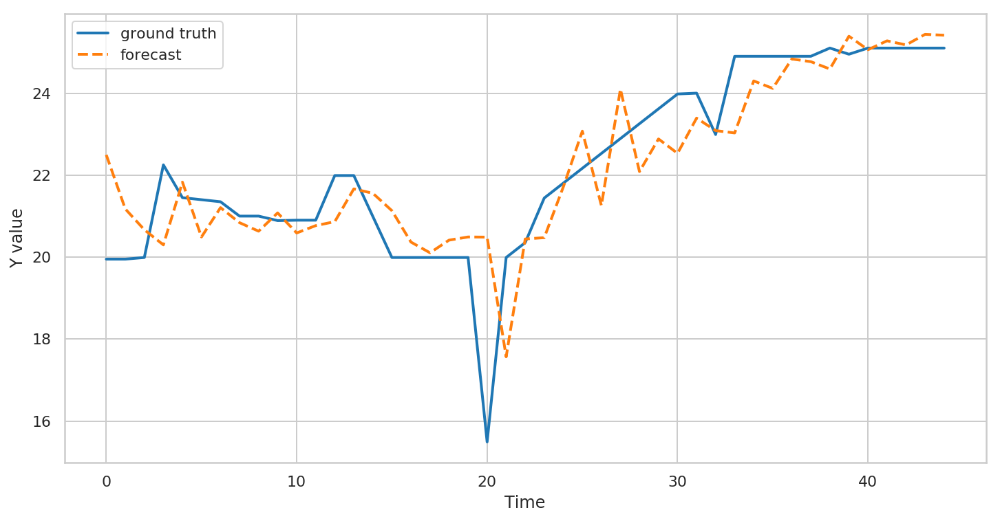

In [ ]:
lstm_Conv(newprice_train, newprice_test, n_steps=12, n_seq=3, n_features=1, n_epochs=500)

In [ ]:
# multivariate lstm example
from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense

# split a multivariate sequence into samples
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps
		# check if we are beyond the dataset
		if end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)

# define input sequence
in_seq1 = array([10, 20, 30, 40, 50, 60, 70, 80, 90])
in_seq2 = array([15, 25, 35, 45, 55, 65, 75, 85, 95])
out_seq = array([in_seq1[i]+in_seq2[i] for i in range(len(in_seq1))])
# convert to [rows, columns] structure
in_seq1 = in_seq1.reshape((len(in_seq1), 1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# horizontally stack columns
dataset = hstack((in_seq1, in_seq2, out_seq))
# choose a number of time steps
n_steps = 3
# convert into input/output
X, y = split_sequences(dataset, n_steps)
# the dataset knows the number of features, e.g. 2
n_features = X.shape[2]

In [ ]:
def lstm_vanilla_multi(input_train, input_test, n_steps, n_epochs):

    # split a multivariate sequence into samples
    def split_sequences(sequences, n_steps):
        X, y = list(), list()
        for i in range(len(sequences)):
            # find the end of this pattern
            end_ix = i + n_steps
            # check if we are beyond the dataset
            if end_ix > len(sequences):
                break
            # gather input and output parts of the pattern
            seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
            X.append(seq_x)
            y.append(seq_y)
        return array(X), array(y)
    
    X, y = split_sequences(input_train, n_steps)
    
    n_features = X.shape[2]
    
    model = Sequential()
#     model.add(LSTM(50, activation='relu', input_shape=(n_steps, n_features)))
#     model.add(Bidirectional(LSTM(50, activation='relu'), input_shape=(n_steps, n_features)))
    
    model.add(LSTM(50, activation='relu', return_sequences=True, input_shape=(n_steps, n_features)))
    model.add(LSTM(50, activation='relu', return_sequences=True)) 
    model.add(LSTM(50, activation='relu'))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')


    print("Training", '.'*10, '\n')
    model.fit(X, y, epochs=n_epochs, verbose=0)
    
    X_test, y_test = split_sequences(np.concatenate((input_train[-n_steps:],input_test), axis=0), n_steps)
    print("Predicting", '.'*10, '\n')
    y_pred = model.predict(X_test, verbose=0)

    def lstm_plot(y_test, y_pred):
        colors = sns.color_palette()
        c1, c2 = colors[0], colors[1]
        fig = plt.figure(figsize=(12, 6))
        ax = fig.add_subplot(1, 1, 1)
        ax.plot(y_test, lw=2, color=c1, label="ground truth")
        ax.plot(y_pred, lw=2, ls="--", color=c2, label="forecast")
        # ax.axvline(time_index[-num_forecast_steps], linestyle="--")
        ax.legend(loc="upper left")
        ax.set_ylabel("Y value")
        ax.set_xlabel("Time")
        fig

    lstm_plot(y_test, y_pred)

Training .......... 

Predicting .......... 



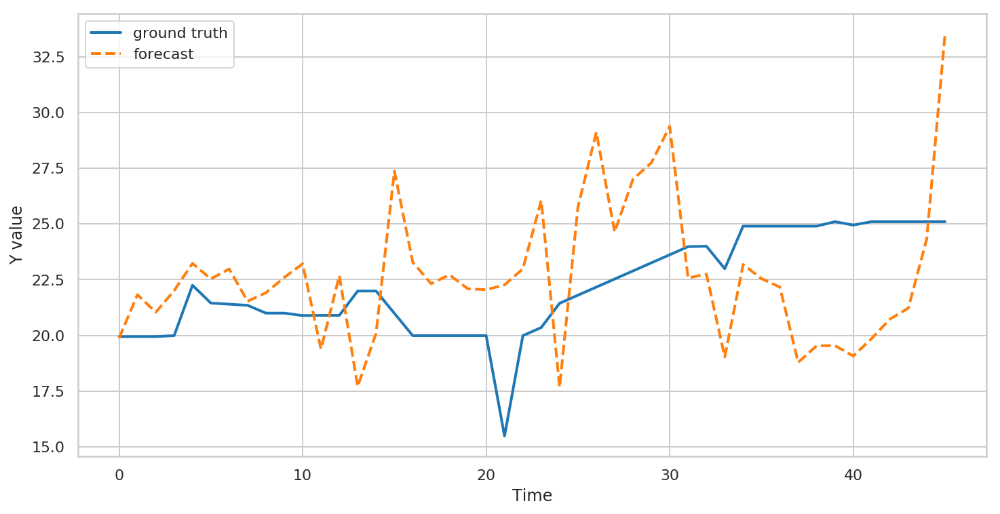

In [ ]:
lstm_vanilla_multi(dataset_train, dataset_test, n_steps=1, n_epochs=500)

In [ ]:
# multivariate multi-step encoder-decoder lstm example
from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed


def lstm_encoder_decoder(input_train, input_test, n_steps_in, n_steps_out, n_epochs):
    # split a multivariate sequence into samples
#     def split_sequences(sequences, n_steps_in, n_steps_out):
#         X, y = list(), list()
#         for i in range(len(sequences)):
#             # find the end of this pattern
#             end_ix = i + n_steps_in
#             out_end_ix = end_ix + n_steps_out
#             # check if we are beyond the dataset
#             if out_end_ix > len(sequences):
#                 break
#             # gather input and output parts of the pattern
#             seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
#             X.append(seq_x)
#             y.append(seq_y)
#         return array(X), array(y)
    
    # split a multivariate sequence into samples
    def split_sequences(sequences, n_steps):
        X, y = list(), list()
        for i in range(len(sequences)):
            # find the end of this pattern
            end_ix = i + n_steps
            # check if we are beyond the dataset
            if end_ix > len(sequences):
                break
            # gather input and output parts of the pattern
            seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
            X.append(seq_x)
            y.append(seq_y)
        return array(X), array(y)

    # covert into input/output
    X, y = split_sequences(input_train, n_steps_in)
    y = y.reshape(y.shape[0], 1, 1)
    # the dataset knows the number of features, e.g. 2
    n_features = X.shape[2]
    # define model
    model = Sequential()
    model.add(LSTM(200, activation='relu', input_shape=(n_steps_in, n_features)))
    model.add(RepeatVector(1))
    model.add(LSTM(200, activation='relu', return_sequences=True))
    model.add(TimeDistributed(Dense(1)))
    model.compile(optimizer='adam', loss='mse')
    # fit model
    
    print("Training", '.'*10, '\n')
    model.fit(X, y, epochs=n_epochs, verbose=0)
    
    X_test, y_test = split_sequences(np.concatenate((input_train[-n_steps_in:],input_test), axis=0), n_steps_in)
    
    print("Predicting", '.'*10, '\n')
    y_pred = model.predict(X_test, verbose=0)
    
    y_pred = y_pred.reshape((y_pred.shape[0], ))

    def lstm_plot(y_test, y_pred):
        colors = sns.color_palette()
        c1, c2 = colors[0], colors[1]
        fig = plt.figure(figsize=(12, 6))
        ax = fig.add_subplot(1, 1, 1)
        ax.plot(y_test, lw=2, color=c1, label="ground truth")
        ax.plot(y_pred, lw=2, ls="--", color=c2, label="forecast")
        # ax.axvline(time_index[-num_forecast_steps], linestyle="--")
        ax.legend(loc="upper left")
        ax.set_ylabel("Y value")
        ax.set_xlabel("Time")
        fig

    lstm_plot(y_test, y_pred)

Training .......... 

Predicting .......... 



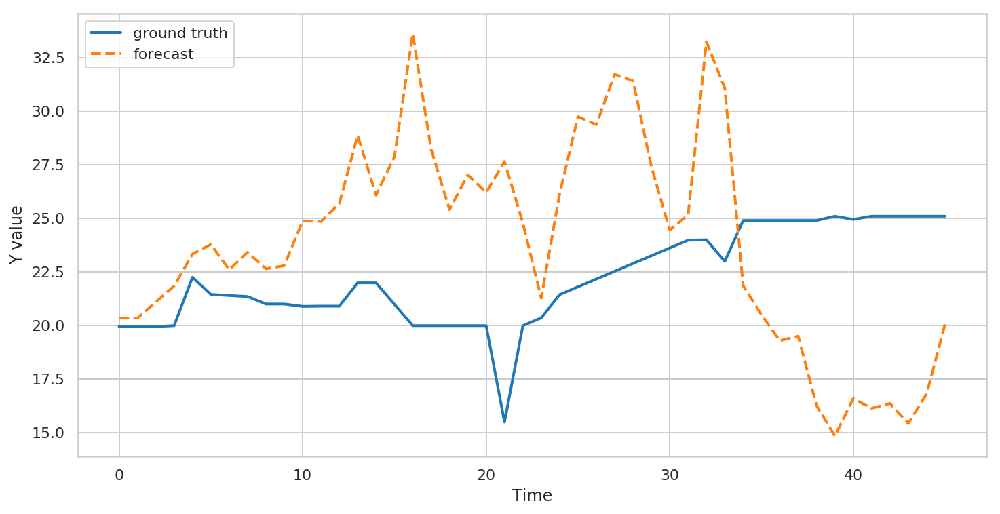

In [ ]:
lstm_encoder_decoder(dataset_train, dataset_test, n_steps_in=7, n_steps_out=1, n_epochs=500)

## CLF

In [ ]:
import pickle

with open('panel_200.pkl', 'rb') as file:
    panel_200 = pickle.load(file)
panel_200.head()

df_single = panel_200.query('id == 1').droplevel(0, axis=0).copy()
df_single.head()


newprice_train = df_single.iloc[:round(0.8*df_single.shape[0]), 0].values
newprice_test = df_single.iloc[round(0.8*df_single.shape[0]):, 0].values

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, Activation

Using TensorFlow backend.


In [ ]:
model_clf = Sequential([
    Dense(32, input_shape=(

# FASTAI

In [ ]:
import pickle

with open('panel_200.pkl', 'rb') as file:
    panel_200 = pickle.load(file)
panel_200.head()

df_single = panel_200.query('id == 1').droplevel(0, axis=0).copy()
df_single.head()

In [ ]:
from fastai import *
from fastai.tabular import *

In [ ]:
procs = [Normalize]

In [ ]:
import pprint

In [ ]:
pprint.pprint(df_single.columns.tolist())

['lowest_newprice',
 'lowest_usedprice',
 'total_new',
 'total_used',
 'sales_rank',
 'sentiment',
 'star',
 'newprice_ternary_1D',
 'newprice_ternary_3D',
 'newprice_ternary_7D',
 'newprice_ternary_1D_ew',
 'newprice_ternary_3D_ew',
 'newprice_ternary_7D_ew',
 'newprice_1D',
 'newprice_3D',
 'newprice_7D',
 'newprice_1D_ew',
 'newprice_3D_ew',
 'newprice_7D_ew',
 'usedprice_ternary_1D',
 'usedprice_ternary_3D',
 'usedprice_ternary_7D',
 'usedprice_ternary_1D_ew',
 'usedprice_ternary_3D_ew',
 'usedprice_ternary_7D_ew',
 'usedprice_1D',
 'usedprice_3D',
 'usedprice_7D',
 'usedprice_1D_ew',
 'usedprice_3D_ew',
 'usedprice_7D_ew',
 'newstock_ternary_1D',
 'newstock_ternary_3D',
 'newstock_ternary_7D',
 'newstock_ternary_1D_ew',
 'newstock_ternary_3D_ew',
 'newstock_ternary_7D_ew',
 'newstock_1D',
 'newstock_3D',
 'newstock_7D',
 'newstock_1D_ew',
 'newstock_3D_ew',
 'newstock_7D_ew',
 'usedstock_ternary_1D',
 'usedstock_ternary_3D',
 'usedstock_ternary_7D',
 'usedstock_ternary_1D_ew',
 'u

In [ ]:
def fastRun(target, single, bs=64):
    
    df_single = panel_200.query(f'id == {single}').droplevel(0, axis=0).copy()
    
    df_all = df_single.loc[:, 
                             [
                             'lowest_usedprice',
                             'total_new',
                             'total_used',
                             'sales_rank',
                             'sentiment',
                             'star',
                             target,
                             ]].copy()
    df_train = df_all.iloc[:178, :].copy()
    df_test = df_all.iloc[178:, :].copy()
    valid_idx = range(len(df_train)-35, len(df_train))
    data = TabularDataBunch.from_df('.', df_train, target, valid_idx=valid_idx, procs=procs, bs=bs)
#     data.show_batch(10)
    learn = tabular_learner(data, layers=[200,100], metrics=mean_squared_error)
    learn.fit_one_cycle(1, 1e-2)
    learn.layer_groups
    df_test['pred'] = [to_np(learn.predict(df_test.iloc[idx])[1])[0] for idx in range(0, df_test.shape[0])]
    with plt.rc_context({'xtick.color': 'white', 'ytick.color': 'white', 'figure.figsize': '12, 6'}):
        df_test[[target, 'pred']].plot()

epoch,train_loss,valid_loss,mean_squared_error,time
0,12.641606,14.431066,14.431066,00:00


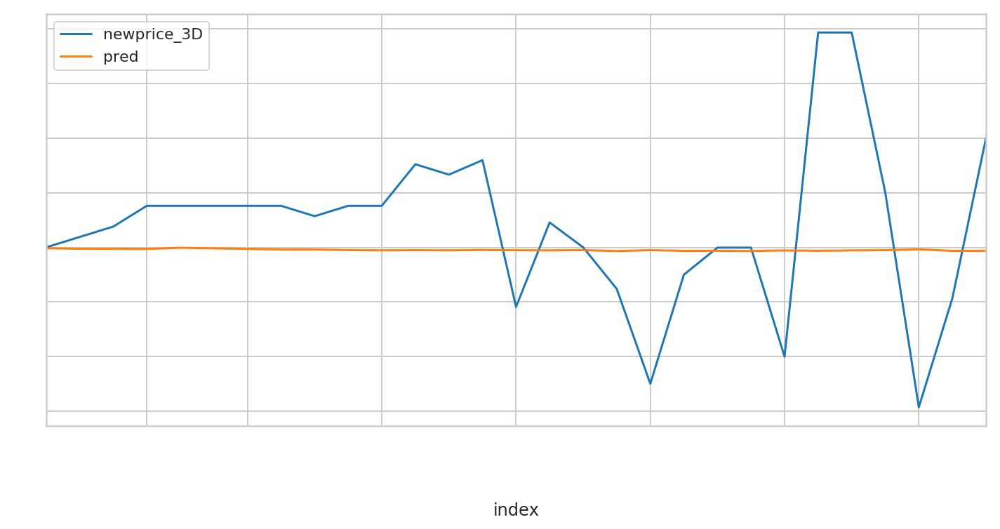

In [ ]:
fastRun('newprice_3D', 9, 64)

# TF Prediction

In [ ]:
from __future__ import absolute_import, division, print_function, unicode_literals
!pip install tensorflow-gpu==2.0.0-beta1
import tensorflow as tf

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd

mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False

In [ ]:
zip_path = tf.keras.utils.get_file(
    origin='https://storage.googleapis.com/tensorflow/tf-keras-datasets/jena_climate_2009_2016.csv.zip',
    fname='jena_climate_2009_2016.csv.zip',
    extract=True)
csv_path, _ = os.path.splitext(zip_path)

In [ ]:
df = pd.read_csv(csv_path)
df.head()

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
0,01.01.2009 00:10:00,996.52,-8.02,265.40,-8.90,93.3,3.33,3.11,0.22,1.94,3.12,1307.75,1.03,1.75,152.3
1,01.01.2009 00:20:00,996.57,-8.41,265.01,-9.28,93.4,3.23,3.02,0.21,1.89,3.03,1309.80,0.72,1.50,136.1
2,01.01.2009 00:30:00,996.53,-8.51,264.91,-9.31,93.9,3.21,3.01,0.20,1.88,3.02,1310.24,0.19,0.63,171.6
3,01.01.2009 00:40:00,996.51,-8.31,265.12,-9.07,94.2,3.26,3.07,0.19,1.92,3.08,1309.19,0.34,0.50,198.0
4,01.01.2009 00:50:00,996.51,-8.27,265.15,-9.04,94.1,3.27,3.08,0.19,1.92,3.09,1309.00,0.32,0.63,214.3


In [ ]:
from pdb import set_trace

In [ ]:
def univariate_data(dataset, start_index, end_index, history_size, target_size):
  data = []
  labels = []

  start_index = start_index + history_size
  if end_index is None:
    end_index = len(dataset) - target_size

  for i in range(start_index, end_index):
    indices = range(i-history_size, i)
    # Reshape data from (history_size,) to (history_size, 1)
    data.append(np.reshape(dataset[indices], (history_size, 1)))
    labels.append(dataset[i+target_size])
  return np.array(data), np.array(labels)

In [ ]:
TRAIN_SPLIT = 300000
tf.random.set_seed(13)

uni_data = df['T (degC)']
uni_data.index = df['Date Time']
uni_data.head()

Date Time
01.01.2009 00:10:00   -8.02
01.01.2009 00:20:00   -8.41
01.01.2009 00:30:00   -8.51
01.01.2009 00:40:00   -8.31
01.01.2009 00:50:00   -8.27
Name: T (degC), dtype: float64

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7fc5cf0e8e48>],
      dtype=object)

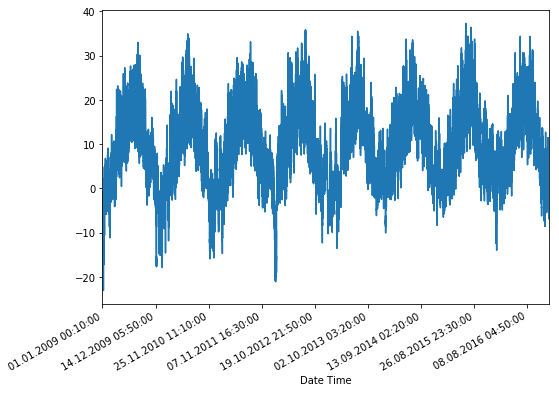

In [ ]:
uni_data.plot(subplots=True)

In [ ]:
uni_data = uni_data.values

In [ ]:
uni_train_mean = uni_data[:TRAIN_SPLIT].mean()
uni_train_std = uni_data[:TRAIN_SPLIT].std()

In [ ]:
uni_data = (uni_data-uni_train_mean)/uni_train_std

In [ ]:
univariate_past_history = 20
univariate_future_target = 0

x_train_uni, y_train_uni = univariate_data(uni_data, 0, TRAIN_SPLIT,
                                           univariate_past_history,
                                           univariate_future_target)
x_val_uni, y_val_uni = univariate_data(uni_data, TRAIN_SPLIT, None,
                                       univariate_past_history,
                                       univariate_future_target)

In [ ]:
print ('Single window of past history')
print (x_train_uni[0])
print(len((x_train_un)
print ('\n Target temperature to predict')
print (y_train_uni[0])

SyntaxError: ignored

In [ ]:
def create_time_steps(length):
  time_steps = []
  for i in range(-length, 0, 1):
    time_steps.append(i)
  return time_steps

In [ ]:
def show_plot(plot_data, delta, title):
  labels = ['History', 'True Future', 'Model Prediction']
  marker = ['.-', 'rx', 'go']
  time_steps = create_time_steps(plot_data[0].shape[0])
  if delta:
    future = delta
  else:
    future = 0

  plt.title(title)
  for i, x in enumerate(plot_data):
    if i:
      plt.plot(future, plot_data[i], marker[i], markersize=10,
               label=labels[i])
    else:
      plt.plot(time_steps, plot_data[i].flatten(), marker[i], label=labels[i])
  plt.legend()
  plt.xlim([time_steps[0], (future+5)*2])
  plt.xlabel('Time-Step')
  return plt

In [ ]:
for i, x in enumerate([x_train_uni[0], y_train_uni[0]]):
    print(i, x, '='*5, '\n')

0 [[-1.99766294]
 [-2.04281897]
 [-2.05439744]
 [-2.0312405 ]
 [-2.02660912]
 [-2.00113649]
 [-1.95134907]
 [-1.95134907]
 [-1.98492663]
 [-2.04513467]
 [-2.08334362]
 [-2.09723778]
 [-2.09376424]
 [-2.09144854]
 [-2.07176515]
 [-2.07176515]
 [-2.07639653]
 [-2.08913285]
 [-2.09260639]
 [-2.10418486]] ===== 

1 -2.1041848598100876 ===== 



<module 'matplotlib.pyplot' from '/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py'>

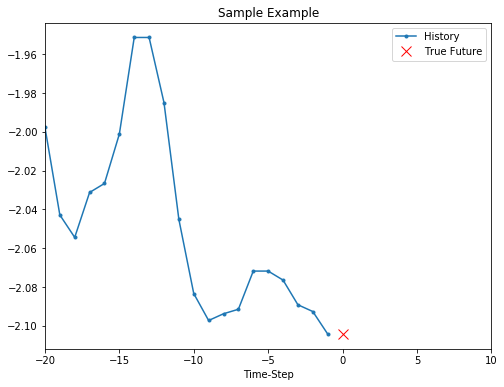

In [ ]:
show_plot([x_train_uni[0], y_train_uni[0]], 0, 'Sample Example')

In [ ]:
def baseline(history):
  return np.mean(history)

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py'>

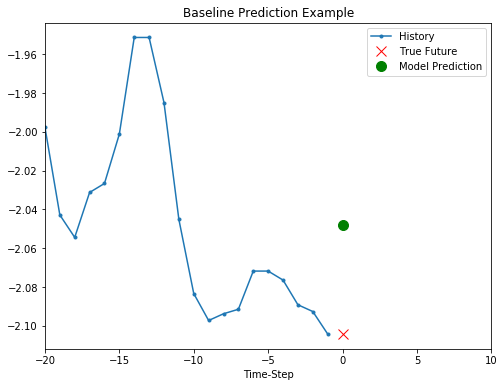

In [ ]:
show_plot([x_train_uni[0], y_train_uni[0], baseline(x_train_uni[0])], 0,
           'Baseline Prediction Example')

In [ ]:
BATCH_SIZE = 256
BUFFER_SIZE = 10000

train_univariate = tf.data.Dataset.from_tensor_slices((x_train_uni, y_train_uni))

train_univariate = train_univariate.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
val_univariate = tf.data.Dataset.from_tensor_slices((x_val_uni, y_val_uni))
val_univariate = val_univariate.batch(BATCH_SIZE).repeat()

In [ ]:
simple_lstm_model = tf.keras.models.Sequential([
    tf.keras.layers.LSTM(8, input_shape=x_train_uni.shape[-2:]),
    tf.keras.layers.Dense(1)
])

simple_lstm_model.compile(optimizer='adam', loss='mae')

In [ ]:
for x, y in val_univariate.take(1):
    print(simple_lstm_model.predict(x).shape)

(256, 1)


In [ ]:
EVALUATION_INTERVAL = 200
EPOCHS = 10

simple_lstm_model.fit(train_univariate, epochs=EPOCHS,
                      steps_per_epoch=EVALUATION_INTERVAL,
                      validation_data=val_univariate, validation_steps=50)

Epoch 1/10
200/200 [==============================] - 2s 12ms/step - loss: 0.3380 - val_loss: 0.0853
Epoch 2/10
200/200 [==============================] - 1s 6ms/step - loss: 0.0813 - val_loss: 0.0321
Epoch 3/10
200/200 [==============================] - 1s 6ms/step - loss: 0.0422 - val_loss: 0.0274
Epoch 4/10
200/200 [==============================] - 1s 6ms/step - loss: 0.0374 - val_loss: 0.0237
Epoch 5/10
200/200 [==============================] - 1s 6ms/step - loss: 0.0269 - val_loss: 0.0220
Epoch 6/10
200/200 [==============================] - 1s 7ms/step - loss: 0.0288 - val_loss: 0.0212
Epoch 7/10
200/200 [==============================] - 1s 6ms/step - loss: 0.0257 - val_loss: 0.0195
Epoch 8/10
200/200 [==============================] - 1s 6ms/step - loss: 0.0245 - val_loss: 0.0189
Epoch 9/10
200/200 [==============================] - 1s 6ms/step - loss: 0.0240 - val_loss: 0.0176
Epoch 10/10
200/200 [==============================] - 1s 6ms/step - loss: 0.0215 - val_loss: 0.016

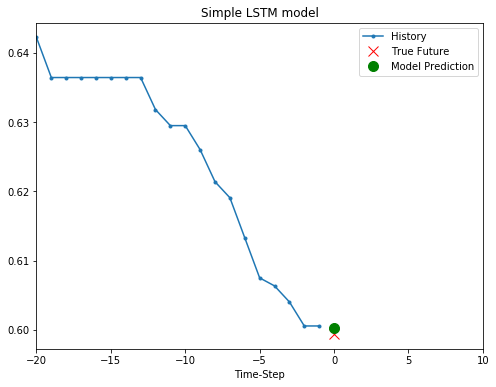

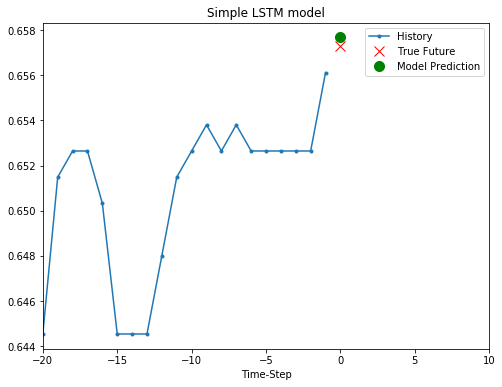

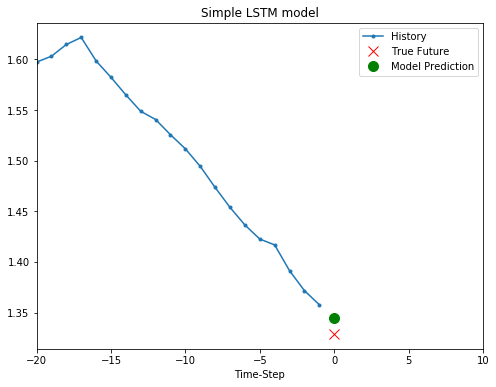

In [ ]:
for x, y in val_univariate.take(3):
  plot = show_plot([x[0].numpy(), y[0].numpy(),
                    simple_lstm_model.predict(x)[0]], 0, 'Simple LSTM model')
  plot.show()

In [ ]:
import pickle
with open('final_final_final.pkl', 'rb') as F:
    dfdf = pickle.load(F)

In [ ]:
dfdf[0].head()

,newprice_t,usedprice_t,newstock_t,usedstock_t,sales_rank_t,sentiment_t,polarity_t,subjectivity_t,star_t,newprice_t-1,newprice_t+1,usedprice_t-1,usedprice_t+1,newstock_t-1,newstock_t+1,usedstock_t-1,usedstock_t+1
2015-02-09,52.00,50.00,14.0,8.0,23.0,-0.209958,-0.142484,0.273572,4.957941,56.3,55.00,49.40,47.99,12.0,16.0,8.0,11.0
2015-02-10,55.00,47.99,16.0,11.0,24.0,-0.209949,-0.142332,0.273653,4.957417,52.0,54.40,50.00,50.99,14.0,17.0,8.0,7.0
2015-02-11,54.40,50.99,17.0,7.0,22.0,-0.209827,-0.140501,0.274654,4.951306,55.0,54.40,47.99,48.99,16.0,16.0,11.0,11.0
2015-02-12,54.40,48.99,16.0,11.0,22.0,-0.209580,-0.137857,0.276163,4.942922,54.4,54.37,50.99,50.99,17.0,17.0,7.0,8.0
2015-02-13,54.37,50.99,17.0,8.0,27.0,-0.209547,-0.137559,0.276338,4.942000,54.4,54.37,48.99,49.79,16.0,17.0,11.0,12.0


In [ ]:
features_considered = dfdf[0].columns[:9].tolist()
features_considered

['newprice_t',
 'usedprice_t',
 'newstock_t',
 'usedstock_t',
 'sales_rank_t',
 'sentiment_t',
 'polarity_t',
 'subjectivity_t',
 'star_t']

In [ ]:
features = dfdf[0][features_considered]
features.index = dfdf[0].index
features.head()

,newprice_t,usedprice_t,newstock_t,usedstock_t,sales_rank_t,sentiment_t,polarity_t,subjectivity_t,star_t,newprice_t+1
2015-02-09,52.00,50.00,14.0,8.0,23.0,-0.209958,-0.142484,0.273572,4.957941,55.00
2015-02-10,55.00,47.99,16.0,11.0,24.0,-0.209949,-0.142332,0.273653,4.957417,54.40
2015-02-11,54.40,50.99,17.0,7.0,22.0,-0.209827,-0.140501,0.274654,4.951306,54.40
2015-02-12,54.40,48.99,16.0,11.0,22.0,-0.209580,-0.137857,0.276163,4.942922,54.37
2015-02-13,54.37,50.99,17.0,8.0,27.0,-0.209547,-0.137559,0.276338,4.942000,54.37


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7fc545e54630>,
      dtype=object)

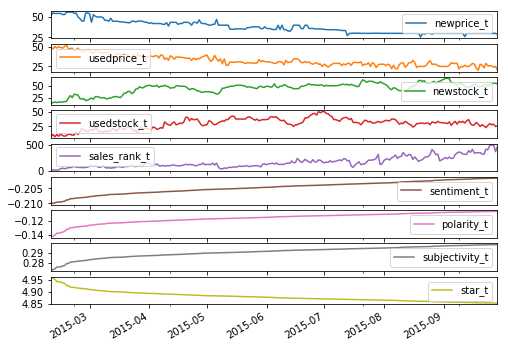

In [ ]:
features.plot(subplots=True)

In [ ]:
dataset = features.values
data_mean = dataset.mean(axis=0)
data_std = dataset.std(axis=0)

In [ ]:
dataset = features.values
data_mean = dataset.mean(axis=0)
data_std = dataset.std(axis=0)

In [ ]:
dataset = (dataset-data_mean)/data_std

In [ ]:
dataset = (dataset-data_mean)/data_std

In [ ]:
def multivariate_data(dataset, target, start_index, end_index, history_size,
                      target_size, step, single_step=False):
  data = []
  labels = []

  start_index = start_index + history_size
  if end_index is None:
    end_index = len(dataset) - target_size

  for i in range(start_index, end_index):
    indices = range(i-history_size, i, step)
    data.append(dataset[indices])

    if single_step:
      labels.append(target[i+target_size])
    else:
      labels.append(target[i:i+target_size])

  return np.array(data), np.array(labels)

In [ ]:
    model.add(Bidirectional(LSTM(50, activation='relu', return_sequences=True),
                            input_shape=(n_steps, n_features)))
    model.add(Dropout(0.3))
#     model.add(Bidirectional(LSTM(200, activation='relu', return_sequences=True)))
#     model.add(Dropout(0.3))
#     model.add(Bidirectional(LSTM(100, activation='relu', return_sequences=True)))
#     model.add(Dropout(0.3))
    model.add(Bidirectional(LSTM(50, activation='relu')))
    model.add(Dropout(0.3))
    model.add(Dense(1)

In [ ]:
def model_nn(df, i):
    features = df.columns[:9].tolist()
    features.append(i)
    data = df[features]
    data.index = df.index
    data = data.values

    X_train, y_train = multivariate_data(data[:, :-1], data[:, -1], 0, 160, 7, 0, 1, single_step=True)
    print(X_train.shape, y_train.shape)
    X_test, y_test = multivariate_data(data[:, :-1], data[:, -1], 160, None, 7, 0, 1, single_step=True)
    print(X_test.shape, y_test.shape)
    

    single_step_model = tf.keras.models.Sequential([
                                                    # tf.keras.layers.Bidirectional(
                                                    #     tf.keras.layers.LSTM(50, return_sequences=True), input_shape=X_train.shape[-2:]
                                                    # ),
                                                    tf.keras.layers.LSTM(64, return_sequences=True, input_shape=X_train.shape[-2:]),
                                                    tf.keras.layers.Dropout(0.2),
                                                    # tf.keras.layers.Bidirectional(
                                                    #     tf.keras.layers.LSTM(25)
                                                    # ),
                                                    tf.keras.layers.LSTM(32, return_sequences=True),
                                                    tf.keras.layers.Dropout(0.2),
                                                    tf.keras.layers.LSTM(16),
                                                    tf.keras.layers.Dropout(0.2),
                                                    tf.keras.layers.Dense(1),
                                                    ]) 
    # single_step_model = tf.keras.models.Sequential()
    # single_step_model.add(tf.keras.layers.LSTM(32,
    #                                         input_shape=X_train.shape[-2:]))
    # single_step_model.add(tf.keras.layers.Dense(1))

    single_step_model.compile(optimizer=tf.keras.optimizers.Adam(), loss='mse')

    EPOCHS = 30
    EVALUATION_INTERVAL = int(len(X_train)/1)

    single_step_history = single_step_model.fit(X_train, y_train, epochs=EPOCHS,
                                                steps_per_epoch=EVALUATION_INTERVAL,
                                                validation_split=0.2,
                                                validation_steps=EVALUATION_INTERVAL,
                                                # verbose=0,
                                                )
    plot_train_history(single_step_history, "TITLE")

    y_pred = [single_step_model.predict(X_test[i].reshape(1, X_test.shape[-2], X_test.shape[-1])) for i in range(X_test.shape[0])]
    y_pred = np.array(y_pred).reshape(len(y_pred),)
    return y_test, y_pred

In [ ]:
tmptest, tmppred = model_nn(dfdf[0], i='newprice_t+1')

(153, 7, 9) (153,)
(60, 7, 9) (60,)


In [ ]:
tmptest.shape, tmppred.shape

((60,), (60,))

In [ ]:
tmp_features = dfdf[0].columns[:9].tolist()
tmp_features.append('newprice_t+1')
tmp_data = dfdf[0][tmp_features]
tmp_data.index = dfdf[0].index
tmp_data  = tmp_data.values


tmpX, tmpY = multivariate_data(tmp_data[:, :-1], tmp_data[:, -1], 0, 160, 3, 0, 1, single_step=True)
tmpX.shape, tmpY.shape

((157, 3, 9), (157,))

In [ ]:
tmpX, tmpY = multivariate_data(dataset[:, :-1], dataset[:, -1], 0, 160, 7, 0, 1, single_step=True)
tmpX.shape, tmpY.shape


((153, 7, 9), (153,))

In [ ]:

tmpX_test, tmpY_test = multivariate_data(dataset[:, :-1], dataset[:, -1], 160, None, 7, 0, 1, single_step=True)
tmpX_test.shape, tmpY_test.shape

((60, 7, 9), (60,))

In [ ]:
single_step_model = tf.keras.models.Sequential()
single_step_model.add(tf.keras.layers.LSTM(32,
                                           input_shape=tmpX.shape[-2:]))
single_step_model.add(tf.keras.layers.Dense(1))

single_step_model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae')

In [ ]:
from keras.utils import plot_model, print_summary
print_summary(single_step_model, line_length=None, positions=None, print_fn=None)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_6 (LSTM)                (None, 32)                5376      
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 33        
Total params: 5,409
Trainable params: 5,409
Non-trainable params: 0
_________________________________________________________________


In [ ]:
single_step_model.predict(tmpX_test[0].reshape(1, 7, 10))

array([[-0.47017005]], dtype=float32)

In [ ]:
EPOCHS = 10
EVALUATION_INTERVAL = 20

single_step_history = single_step_model.fit(tmpX, tmpY, epochs=EPOCHS,
                                            steps_per_epoch=EVALUATION_INTERVAL,
                                            # validation_data=,
                                            validation_split=0.2,
                                            validation_steps=20)

Train on 20 samples, validate on 31 samples
Epoch 1/10
20/20 [==============================] - 1s 25ms/step - loss: 0.3622 - val_loss: 0.2922
Epoch 2/10
20/20 [==============================] - 0s 5ms/step - loss: 0.2350 - val_loss: 0.3004
Epoch 3/10
20/20 [==============================] - 0s 5ms/step - loss: 0.2016 - val_loss: 0.2717
Epoch 4/10
20/20 [==============================] - 0s 6ms/step - loss: 0.1929 - val_loss: 0.2363
Epoch 5/10
20/20 [==============================] - 0s 5ms/step - loss: 0.1865 - val_loss: 0.2202
Epoch 6/10
20/20 [==============================] - 0s 5ms/step - loss: 0.1814 - val_loss: 0.2360
Epoch 7/10
20/20 [==============================] - 0s 6ms/step - loss: 0.1766 - val_loss: 0.2685
Epoch 8/10
20/20 [==============================] - 0s 5ms/step - loss: 0.1718 - val_loss: 0.3072
Epoch 9/10
20/20 [==============================] - 0s 6ms/step - loss: 0.1675 - val_loss: 0.3349
Epoch 10/10
20/20 [==============================] - 0s 5ms/step - loss: 

In [ ]:
single_step_model.predict(tmpX_test[0].reshape((1, 7, 9)))

array([[-0.4047987]], dtype=float32)

In [ ]:
df_lst = dfdf

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.linear_model import ElasticNet

import numpy as np

def MAPE(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def AIC(true, pred, k):
    return len(true)*np.log(np.sum((true - pred)**2)/len(true)) + 2*k

def BIC(true, pred, k):
    return len(true)*np.log(np.sum((true - pred)**2)/len(true)) + k*np.log(len(true))


def main_NN():
    ENDO = ['newprice_t+1', 'usedprice_t+1', 'newstock_t+1', 'usedstock_t+1']
    all_metric = []
    
    for i in ENDO:
        metric_df_list = []
        for idx, df in enumerate(df_lst):
            test, pred = model_nn(df, i)
            print("="*10, "RUNNING", idx, "="*10)

            mape = MAPE(test, pred)
            mae = mean_absolute_error(test, pred)
            rmse = np.sqrt(mean_squared_error(test, pred))
            r2 = r2_score(test, pred)
            aic = AIC(test, pred, df.shape[0]-1)
            bic = BIC(test, pred, df.shape[0]-1) 
            
            metric_dict = {
                f'{i}_ID': idx,
                f'{i}_R2': r2,
                f'{i}_MAE': mae,
                f'{i}_RMSE': rmse,
                f'{i}_MAPE': mape,
                f'{i}_AIC': aic,
                f'{i}_BIC': bic,
            }
            metric_df_list.append(pd.DataFrame(metric_dict, index=[idx]))
            print("="*10, "DONE", idx, "="*10)
        all_metric.append(pd.concat(metric_df_list).mean(axis=0))
        all_metric.append(pd.concat(metric_df_list).median(axis=0))
        
    # final_price, final_stock = summ(all_metric)
    
    return all_metric

In [ ]:
nn_metric = main_NN()

(153, 7, 9) (153,)
(60, 7, 9) (60,)
========== RUNNING 0 ==========
========== DONE 0 ==========
(153, 7, 9) (153,)
(61, 7, 9) (61,)
========== RUNNING 1 ==========
========== DONE 1 ==========
(153, 7, 9) (153,)
(62, 7, 9) (62,)
========== RUNNING 2 ==========
========== DONE 2 ==========
(153, 7, 9) (153,)
(43, 7, 9) (43,)
========== RUNNING 3 ==========
========== DONE 3 ==========
(153, 7, 9) (153,)
(60, 7, 9) (60,)
========== RUNNING 4 ==========
========== DONE 4 ==========
(153, 7, 9) (153,)
(61, 7, 9) (61,)
========== RUNNING 5 ==========
========== DONE 5 ==========
(153, 7, 9) (153,)
(61, 7, 9) (61,)
========== RUNNING 6 ==========
========== DONE 6 ==========
(153, 7, 9) (153,)
(30, 7, 9) (30,)
========== RUNNING 7 ==========
========== DONE 7 ==========
(153, 7, 9) (153,)
(61, 7, 9) (61,)
========== RUNNING 8 ==========
========== DONE 8 ==========
(153, 7, 9) (153,)
(61, 7, 9) (61,)
========== RUNNING 9 ==========
========== DONE 9 ==========
(153, 7, 9) (153,)
(60, 7, 9) 

In [ ]:
nn_metric

[newprice_t+1_ID      2.150000e+01
 newprice_t+1_R2     -3.437308e+28
 newprice_t+1_MAE     2.881654e+00
 newprice_t+1_RMSE    3.327130e+00
 newprice_t+1_MAPE    1.725476e+01
 newprice_t+1_AIC     5.582987e+02
 newprice_t+1_BIC     1.023301e+03
 dtype: float64, newprice_t+1_ID        21.500000
 newprice_t+1_R2        -2.395372
 newprice_t+1_MAE        2.025101
 newprice_t+1_RMSE       2.774863
 newprice_t+1_MAPE      14.731836
 newprice_t+1_AIC      570.819438
 newprice_t+1_BIC     1040.910769
 dtype: float64, usedprice_t+1_ID        21.500000
 usedprice_t+1_R2        -5.550059
 usedprice_t+1_MAE        3.140153
 usedprice_t+1_RMSE       3.584519
 usedprice_t+1_MAPE      27.628013
 usedprice_t+1_AIC      571.670970
 usedprice_t+1_BIC     1036.672836
 dtype: float64, usedprice_t+1_ID        21.500000
 usedprice_t+1_R2        -1.364980
 usedprice_t+1_MAE        2.423728
 usedprice_t+1_RMSE       2.860564
 usedprice_t+1_MAPE      20.930945
 usedprice_t+1_AIC      572.441700
 usedprice_t+1

In [ ]:
def summ(metric_lst):
    new_lst = []
    for i in metric_lst:
        name = i.index
        i.index = [n.replace('new', '') for n in name]
        name = i.index
        i.index = [n.replace('used', '') for n in name]
        new_lst.append(i)
    s1, s2, s3, s4, s5, s6, s7, s8 = (i for i in new_lst)

    return [(s1+s3)/2, (s2+s4)/2, (s5+s7)/2, (s6+s8)/2]
  

In [ ]:
from copy import copy
tmp_metric = copy(nn_metric)

In [ ]:
summ(tmp_metric)

[price_t+1_ID      2.150000e+01
 price_t+1_R2     -1.718654e+28
 price_t+1_MAE     3.010904e+00
 price_t+1_RMSE    3.455824e+00
 price_t+1_MAPE    2.244139e+01
 price_t+1_AIC     5.649848e+02
 price_t+1_BIC     1.029987e+03
 dtype: float64, price_t+1_ID        21.500000
 price_t+1_R2        -1.880176
 price_t+1_MAE        2.224414
 price_t+1_RMSE       2.817714
 price_t+1_MAPE      17.831391
 price_t+1_AIC      571.630569
 price_t+1_BIC     1043.337170
 dtype: float64, stock_t+1_ID        21.500000
 stock_t+1_R2       -29.313230
 stock_t+1_MAE       17.334704
 stock_t+1_RMSE      18.361291
 stock_t+1_MAPE      23.957583
 stock_t+1_AIC      735.844757
 stock_t+1_BIC     1200.846623
 dtype: float64, stock_t+1_ID        21.500000
 stock_t+1_R2        -4.175603
 stock_t+1_MAE        9.168973
 stock_t+1_RMSE      10.627391
 stock_t+1_MAPE      18.620556
 stock_t+1_AIC      724.304469
 stock_t+1_BIC     1203.305096
 dtype: float64]

In [ ]:
past_history = 720
future_target = 72
STEP = 6

x_train_single, y_train_single = multivariate_data(dataset, dataset[:, 1], 0,
                                                   TRAIN_SPLIT, past_history,
                                                   future_target, STEP,
                                                   single_step=True)
x_val_single, y_val_single = multivariate_data(dataset, dataset[:, 1],
                                               TRAIN_SPLIT, None, past_history,
                                               future_target, STEP,
                                               single_step=True)

In [ ]:
print ('Single window of past history : {}'.format(x_train_single[0].shape))

Single window of past history : (30, 9)


In [ ]:
train_data_single = tf.data.Dataset.from_tensor_slices((x_train_single, y_train_single))

In [ ]:
tmp=train_data_single.cache()

In [ ]:

train_data_single = train_data_single.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()

val_data_single = tf.data.Dataset.from_tensor_slices((x_val_single, y_val_single))
val_data_single = val_data_single.batch(BATCH_SIZE).repeat()

In [ ]:
BUFFER_SIZE = 500
BATCH_SIZE = 16
train_data_single = tf.data.Dataset.from_tensor_slices((x_train_single, y_train_single))
train_data_single = train_data_single.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()

val_data_single = tf.data.Dataset.from_tensor_slices((x_val_single, y_val_single))
val_data_single = val_data_single.batch(BATCH_SIZE).repeat()

In [ ]:
single_step_model = tf.keras.models.Sequential()
single_step_model.add(tf.keras.layers.LSTM(32,
                                           input_shape=x_train_single.shape[-2:]))
single_step_model.add(tf.keras.layers.Dense(1))

single_step_model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae')

In [ ]:
for x, y in val_data_single.take(1):
  print(single_step_model.predict(x).shape)

(16, 1)


In [ ]:
single_step_history = single_step_model.fit(train_data_single, epochs=EPOCHS,
                                            steps_per_epoch=EVALUATION_INTERVAL,
                                            validation_data=val_data_single,
                                            validation_steps=50)

Epoch 1/10
200/200 [==============================] - 3s 17ms/step - loss: 0.3250 - val_loss: 0.2666
Epoch 2/10
200/200 [==============================] - 2s 11ms/step - loss: 0.2680 - val_loss: 0.2564
Epoch 3/10
200/200 [==============================] - 2s 11ms/step - loss: 0.2653 - val_loss: 0.2490
Epoch 4/10
200/200 [==============================] - 2s 11ms/step - loss: 0.2607 - val_loss: 0.2437
Epoch 5/10
200/200 [==============================] - 2s 11ms/step - loss: 0.2317 - val_loss: 0.2383
Epoch 6/10
200/200 [==============================] - 2s 12ms/step - loss: 0.2452 - val_loss: 0.2570
Epoch 7/10
200/200 [==============================] - 2s 11ms/step - loss: 0.2464 - val_loss: 0.2608
Epoch 8/10
200/200 [==============================] - 2s 10ms/step - loss: 0.2479 - val_loss: 0.2460
Epoch 9/10
200/200 [==============================] - 2s 10ms/step - loss: 0.2476 - val_loss: 0.2454
Epoch 10/10
200/200 [==============================] - 2s 10ms/step - loss: 0.2451 - val_lo

In [ ]:
EPOCHS = 20
EVALUATION_INTERVAL = 30

single_step_history = single_step_model.fit(train_data_single, epochs=EPOCHS,
                                            steps_per_epoch=EVALUATION_INTERVAL,
                                            validation_data=val_data_single,
                                            validation_steps=30)

Epoch 1/20
30/30 [==============================] - 2s 54ms/step - loss: 0.2009 - val_loss: 0.2440
Epoch 2/20
30/30 [==============================] - 0s 9ms/step - loss: 0.1662 - val_loss: 0.2243
Epoch 3/20
30/30 [==============================] - 0s 8ms/step - loss: 0.1539 - val_loss: 0.3531
Epoch 4/20
30/30 [==============================] - 0s 8ms/step - loss: 0.1590 - val_loss: 0.2229
Epoch 5/20
30/30 [==============================] - 0s 9ms/step - loss: 0.1509 - val_loss: 0.2097
Epoch 6/20
30/30 [==============================] - 0s 10ms/step - loss: 0.1614 - val_loss: 0.3103
Epoch 7/20
30/30 [==============================] - 0s 9ms/step - loss: 0.1385 - val_loss: 0.1998
Epoch 8/20
30/30 [==============================] - 0s 9ms/step - loss: 0.1494 - val_loss: 0.1365
Epoch 9/20
30/30 [==============================] - 0s 9ms/step - loss: 0.1362 - val_loss: 0.1918
Epoch 10/20
30/30 [==============================] - 0s 9ms/step - loss: 0.1448 - val_loss: 0.1589
Epoch 11/20
30/30

In [ ]:
def plot_train_history(history, title):
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  epochs = range(len(loss))

  plt.figure()

  plt.plot(epochs, loss, 'b', label='Training loss')
  plt.plot(epochs, val_loss, 'r', label='Validation loss')
  plt.title(title)
  plt.legend()

  plt.show()

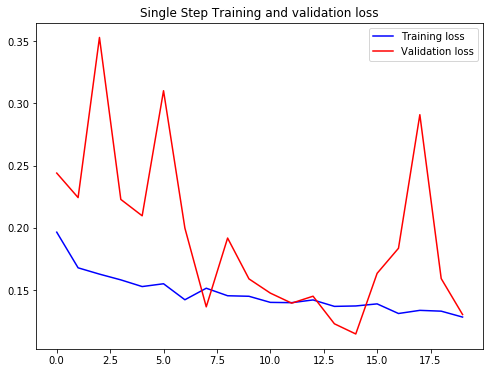

In [ ]:
plot_train_history(single_step_history,
                   'Single Step Training and validation loss')

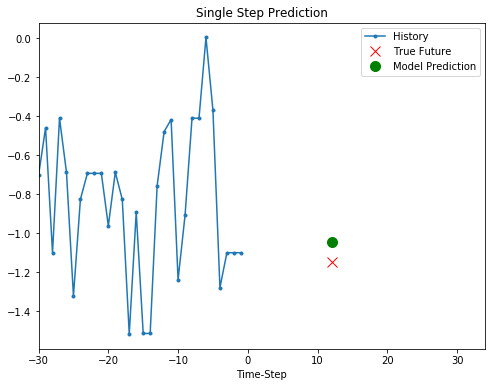

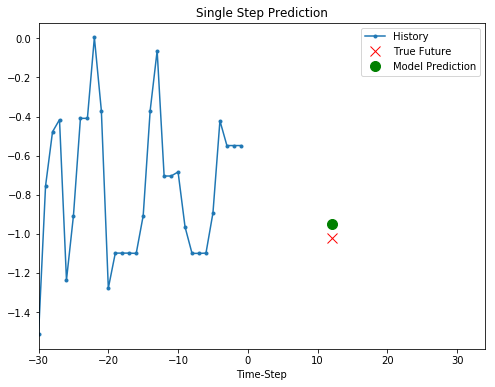

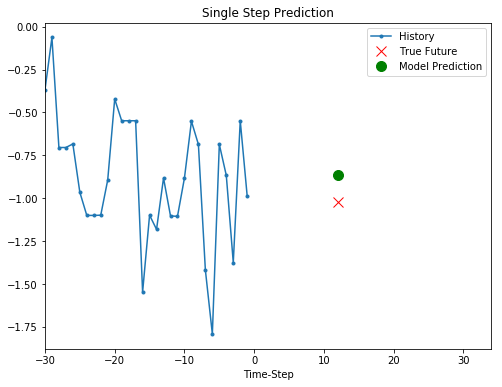

In [ ]:
for x, y in val_data_single.take(3):
  plot = show_plot([x[0][:, 1].numpy(), y[0].numpy(),
                    single_step_model.predict(x)[0]], 12,
                   'Single Step Prediction')
  plot.show()

In [ ]:
future_target = 72
x_train_multi, y_train_multi = multivariate_data(dataset, dataset[:, 1], 0,
                                                 TRAIN_SPLIT, past_history,
                                                 future_target, STEP)
x_val_multi, y_val_multi = multivariate_data(dataset, dataset[:, 1],
                                             TRAIN_SPLIT, None, past_history,
                                             future_target, STEP)

In [ ]:
print ('Single window of past history : {}'.format(x_train_multi[0].shape))
print ('\n Target temperature to predict : {}'.format(y_train_multi[0].shape))

Single window of past history : (120, 3)

 Target temperature to predict : (72,)


In [ ]:
train_data_multi = tf.data.Dataset.from_tensor_slices((x_train_multi, y_train_multi))
train_data_multi = train_data_multi.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()

val_data_multi = tf.data.Dataset.from_tensor_slices((x_val_multi, y_val_multi))
val_data_multi = val_data_multi.batch(BATCH_SIZE).repeat()

In [ ]:
def multi_step_plot(history, true_future, prediction):
  plt.figure(figsize=(12, 6))
  num_in = create_time_steps(len(history))
  num_out = len(true_future)

  plt.plot(num_in, np.array(history[:, 1]), label='History')
  plt.plot(np.arange(num_out)/STEP, np.array(true_future), 'bo',
           label='True Future')
  if prediction.any():
    plt.plot(np.arange(num_out)/STEP, np.array(prediction), 'ro',
             label='Predicted Future')
  plt.legend(loc='upper left')
  plt.show()

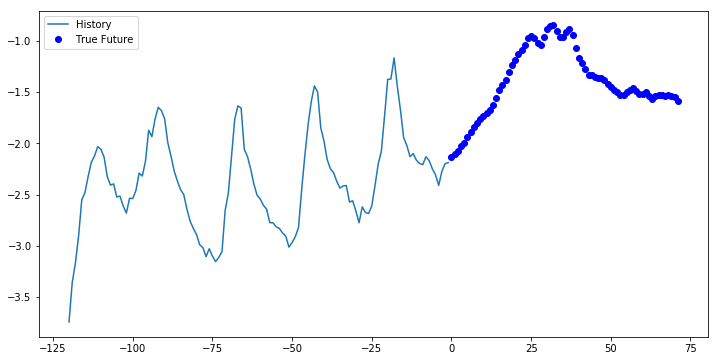

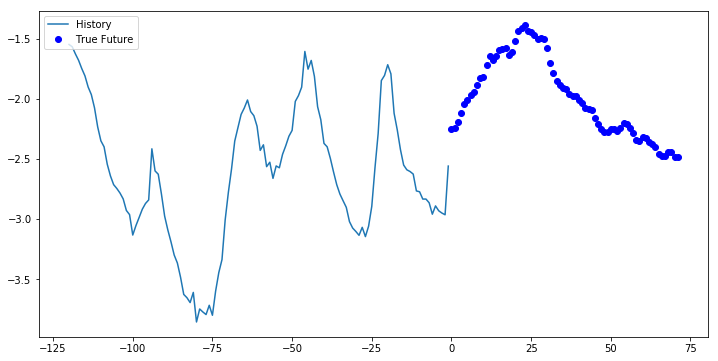

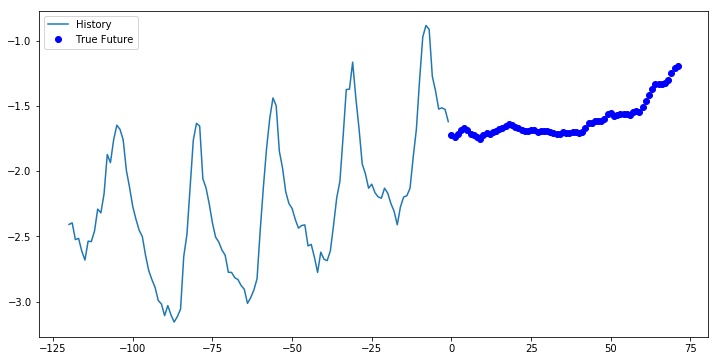

In [ ]:
for x, y in train_data_multi.take(3):
  multi_step_plot(x[0], y[0], np.array([0]))

In [ ]:
multi_step_model = tf.keras.models.Sequential()
multi_step_model.add(tf.keras.layers.LSTM(32,
                                          return_sequences=True,
                                          input_shape=x_train_multi.shape[-2:]))
multi_step_model.add(tf.keras.layers.LSTM(16, activation='relu'))
multi_step_model.add(tf.keras.layers.Dense(72))

multi_step_model.compile(optimizer=tf.keras.optimizers.RMSprop(clipvalue=1.0), loss='mae')

In [ ]:
for x, y in val_data_multi.take(1):
  print (multi_step_model.predict(x).shape)

(256, 72)


In [ ]:
multi_step_history = multi_step_model.fit(train_data_multi, epochs=EPOCHS,
                                          steps_per_epoch=EVALUATION_INTERVAL,
                                          validation_data=val_data_multi,
                                          validation_steps=50)

Epoch 1/10
200/200 [==============================] - 77s 384ms/step - loss: 6.0028 - val_loss: 0.3172
Epoch 2/10
200/200 [==============================] - 75s 373ms/step - loss: 0.3671 - val_loss: 0.3035
Epoch 3/10
200/200 [==============================] - 74s 368ms/step - loss: 0.3536 - val_loss: 0.2673
Epoch 4/10
200/200 [==============================] - 73s 365ms/step - loss: 2.2497 - val_loss: 0.2581
Epoch 5/10
200/200 [==============================] - 73s 366ms/step - loss: 0.3915 - val_loss: 0.2258
Epoch 6/10
200/200 [==============================] - 74s 371ms/step - loss: 0.2260 - val_loss: 0.2267
Epoch 7/10
200/200 [==============================] - 74s 370ms/step - loss: 0.2142 - val_loss: 0.2065
Epoch 8/10
200/200 [==============================] - 74s 370ms/step - loss: 0.2072 - val_loss: 0.1984
Epoch 9/10
200/200 [==============================] - 74s 368ms/step - loss: 0.2097 - val_loss: 0.1952
Epoch 10/10
200/200 [==============================] - 73s 366ms/step - l

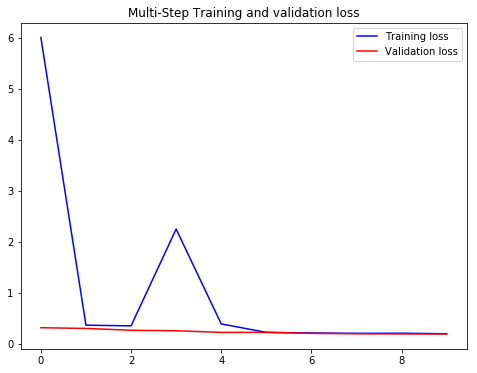

In [ ]:
plot_train_history(multi_step_history, 'Multi-Step Training and validation loss')

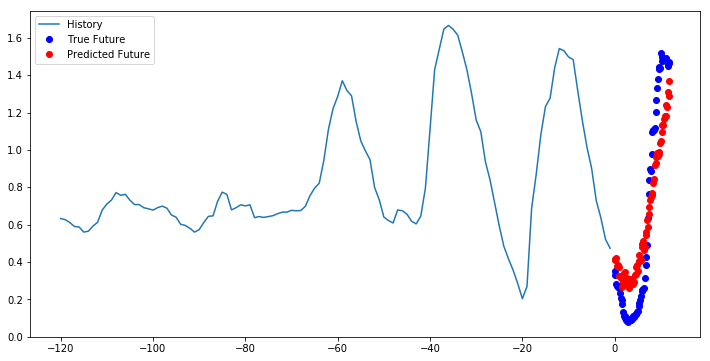

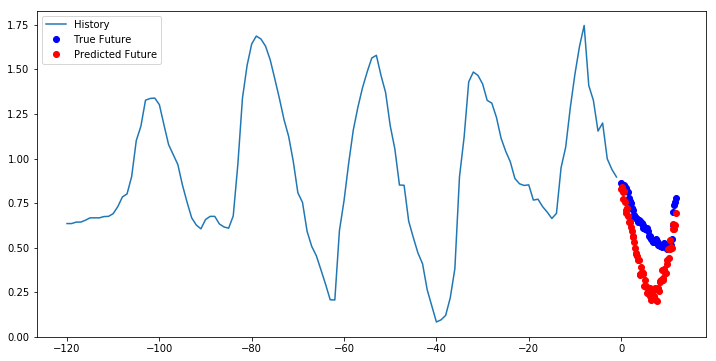

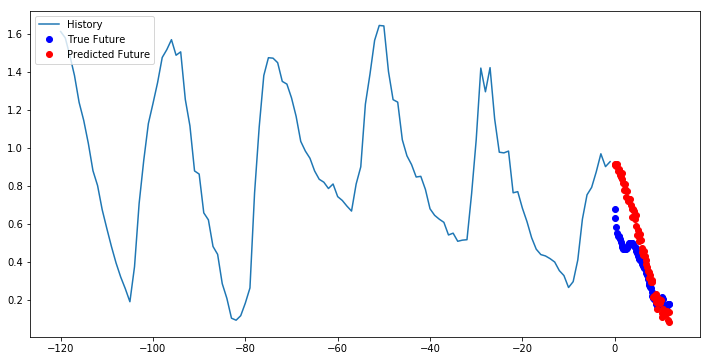

In [ ]:
for x, y in val_data_multi.take(3):
  multi_step_plot(x[0], y[0], multi_step_model.predict(x)[0])